In [1]:
# imports
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import math
import time
from shapely.geometry import Polygon
import shapely.ops as so
import shapely
from matplotlib.backends.backend_pdf import PdfPages

4.5 0.5
4.0 -3.0


Text(2.0, 2.6, '?')

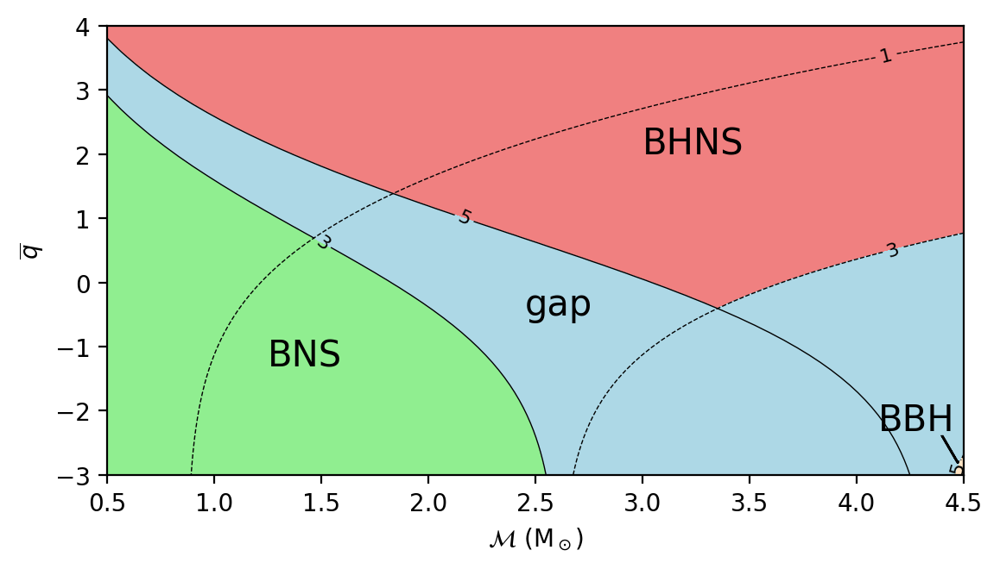

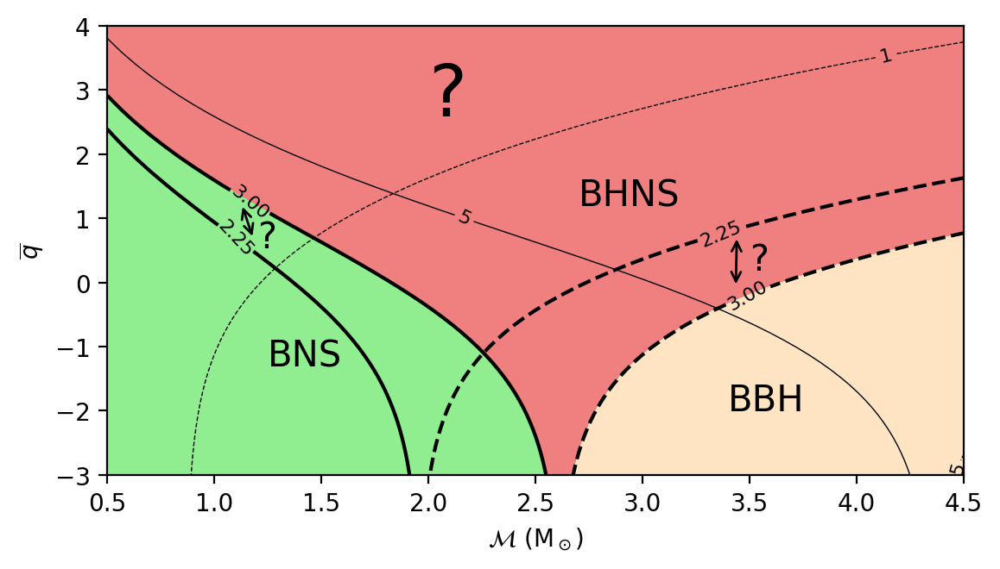

In [ ]:
# graph for merger definiton regions

n=61
mch=0.5+4.0/(n-1)*(np.arange(61))
print(max(mch),min(mch))
q=-3.0+7.0/(n-1)*(np.arange(61))
print(max(q),min(q))
realq = np.array([math.exp(i)+1 for i in q])
m1=mch*((1+realq[:,np.newaxis])**0.2)*(realq[:,np.newaxis]**0.4)
m2=m1/realq[:,np.newaxis]

# PLOT FOR OLD DEFINITIONS
# plot properties
fig, ax = plt.subplots()
fig.dpi = 200
ax.set_aspect(0.3)
plt.ylabel(r"$\overline{q}$")
plt.xlabel(r"$\mathcal{M}$ (M$_\odot$)")
ax.set_xlim([0.5,4.5])
ax.set_ylim([-3,4])

# draws regions of types of mergers corresponding to their assigned color
ax.contourf(mch,q,m1,[0,3],colors='lightgreen')
ax.contourf(mch,q,m1,[3,5],colors='lightblue')
ax.contourf(mch,q,m2,[3,5],colors='lightblue')
ax.contourf(mch,q,m1,[0,50],colors='lightcoral',zorder=-20)
ax.contourf(mch,q,m2,[5,6],colors='bisque')

# draws contours of m1 and m2
mass1_contour = ax.contour(mch,q,m1,[3,5],colors='black',linestyles='solid',linewidths=0.5)
mass2_contour = ax.contour(mch,q,m2,[1,3,5],colors='black',linestyles='dashed',linewidths=0.5)
mass1_contour.clabel(mass1_contour.levels,inline=True,fontsize=8)
mass2_contour.clabel(mass2_contour.levels,inline=True,fontsize=8)

# labels regions
plt.arrow(4.4,-2.4,0.07,-0.4)
ax.text(1.25,-1.3,"BNS",fontsize=15)
ax.text(3,2,"BHNS",fontsize=15)
ax.text(2.45,-0.5,"gap",fontsize=15)
ax.text(4.1,-2.3,"BBH",fontsize=15)

# PLOT FOR NEW DEFINITIONS
fig, ax = plt.subplots()
fig.dpi = 200
ax.set_aspect(0.3)
plt.ylabel(r"$\overline{q}$")
plt.xlabel(r"$\mathcal{M}$ (M$_\odot$)")
ax.set_xlim([0.5,4.5])
ax.set_ylim([-3,4])

# draws regions of types of mergers corresponding to their assigned color
ax.contourf(mch,q,m1,[0,3],colors='lightgreen')
ax.contourf(mch,q,m1,[0,50],colors='lightcoral',zorder=-20)
ax.contourf(mch,q,m2,[3,6],colors='bisque')

# draws contours of m1 and m2
mass1_contour1 = ax.contour(mch,q,m1,[5],colors='black',linestyles='solid',linewidths=0.5)
mass1_contour2 = ax.contour(mch,q,m1,[2.25,3],colors='black',linestyles='solid')
mass2_contour1 = ax.contour(mch,q,m2,[1,5],colors='black',linestyles='dashed',linewidths=0.5)
mass2_contour2 = ax.contour(mch,q,m2,[2.25,3],colors='black',linestyles='dashed')
mass1_contour1.clabel(mass1_contour1.levels,inline=True,fontsize=8)
mass1_contour2.clabel(mass1_contour2.levels,inline=True,fontsize=8)
mass2_contour1.clabel(mass2_contour1.levels,inline=True,fontsize=8)
mass2_contour2.clabel(mass2_contour2.levels,inline=True,fontsize=8)

# labels regions
plt.annotate('', xy=(3.435,-0.1), xytext=(3.44,0.75), arrowprops=dict(arrowstyle='<->'))
ax.text(3.5,0.2,"?",fontsize=15)
plt.annotate('', xy=(1.185,0.65), xytext=(1.125,1.25), arrowprops=dict(arrowstyle='<->'))
ax.text(1.2,0.55,"?",fontsize=15)
ax.text(1.25,-1.3,"BNS",fontsize=15)
ax.text(2.7,1.2,"BHNS",fontsize=15)
ax.text(3.4,-2.0,"BBH",fontsize=15)
ax.text(2.0,2.6,"?",fontsize=30)

In [6]:
# INPUT DATA (change this only to test automation)
# merger probabilities

signal_name = "GW190426"
candidate_p_bns = 0.15
candidate_p_bhns = 0.60
candidate_p_gap = 0.25
candidate_p_bbh = 0.00
candidate_p_ns = 0.01

# signal_name = "S230529ay"
# candidate_p_bns = 0.33
# candidate_p_bhns = 0.67
# candidate_p_gap = 0.98
# candidate_p_bbh = 0.00
# candidate_p_ns = 1.00

# signal_name = "S230528a"
# candidate_p_bns = 0.3125
# candidate_p_bhns = 0.6875
# candidate_p_gap = 0.97
# candidate_p_bbh = 0.00
# candidate_p_ns = 1.00

# signal_name = "S230518h"
# candidate_p_bns = 0.0
# candidate_p_bhns = 0.96
# candidate_p_gap = 0.0
# candidate_p_bbh = 0.04
# candidate_p_ns = 1.0

# signal_name = "S230627c"
# candidate_p_bns = 0.0
# candidate_p_bhns = 0.507
# candidate_p_gap = 0.258
# candidate_p_bbh = 0.493
# candidate_p_ns = 0.00015

# importing data generated from mass constraints through link to csv file
url = 'https://raw.githubusercontent.com/laffytaffyz/summer-mini-project-2023/main/constraints%20testing%20data/constraints1.csv' # change constraint data by changing the fifth to last character
constraint_n = int(url[-5])
ns_mass_limit = 3 if (constraint_n == 1 or constraint_n == 2 or constraint_n == 3 or constraint_n == 4) else 2.25
mass_outer_limit = 0 if (constraint_n == 1 or constraint_n == 3 or constraint_n == 5 or constraint_n == 6) else 1
original_df = pd.read_csv(url)
original_df.head()

,Unnamed: 0,mch_0,q_0,e_q,p_bns,p_bhns,p_gap,p_bbh,p_ns
0,0,0.5,4.0,1.00,0.139691,0.578122,0.282187,0.0,1.000000
1,1,0.5,4.0,1.25,0.193355,0.562651,0.243994,0.0,1.000000
2,2,0.5,4.0,1.50,0.235320,0.552280,0.212401,0.0,1.000000
3,3,0.5,4.0,1.75,0.268146,0.544845,0.187007,0.0,0.999998
4,4,0.5,4.0,2.00,0.294199,0.539232,0.166538,0.0,0.999970


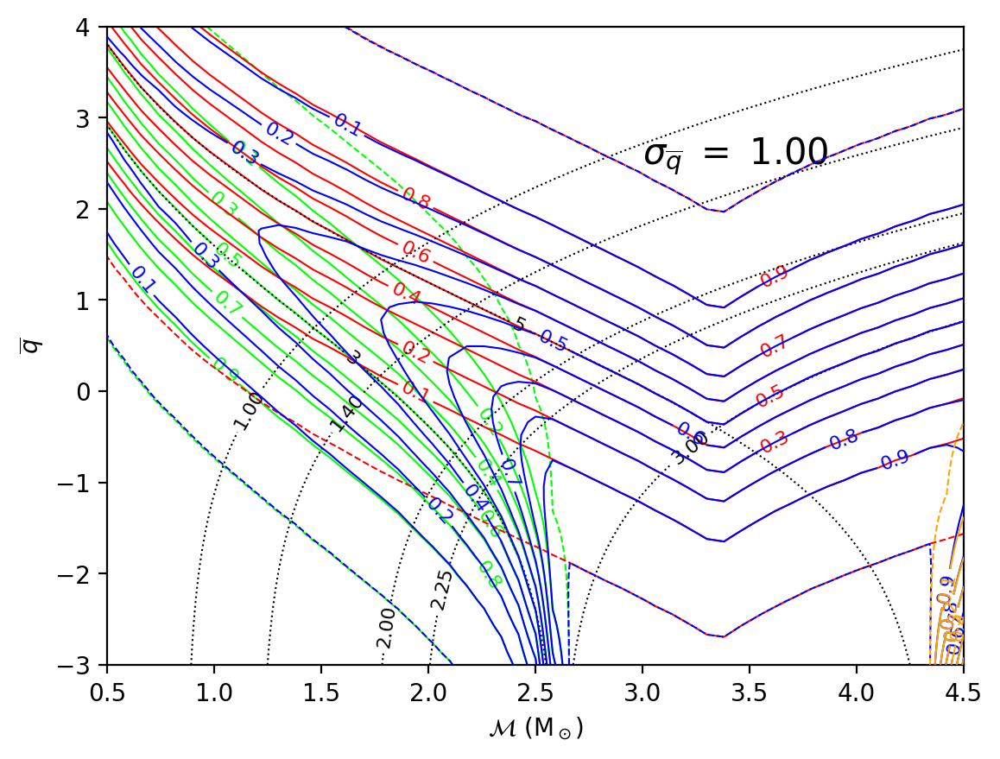

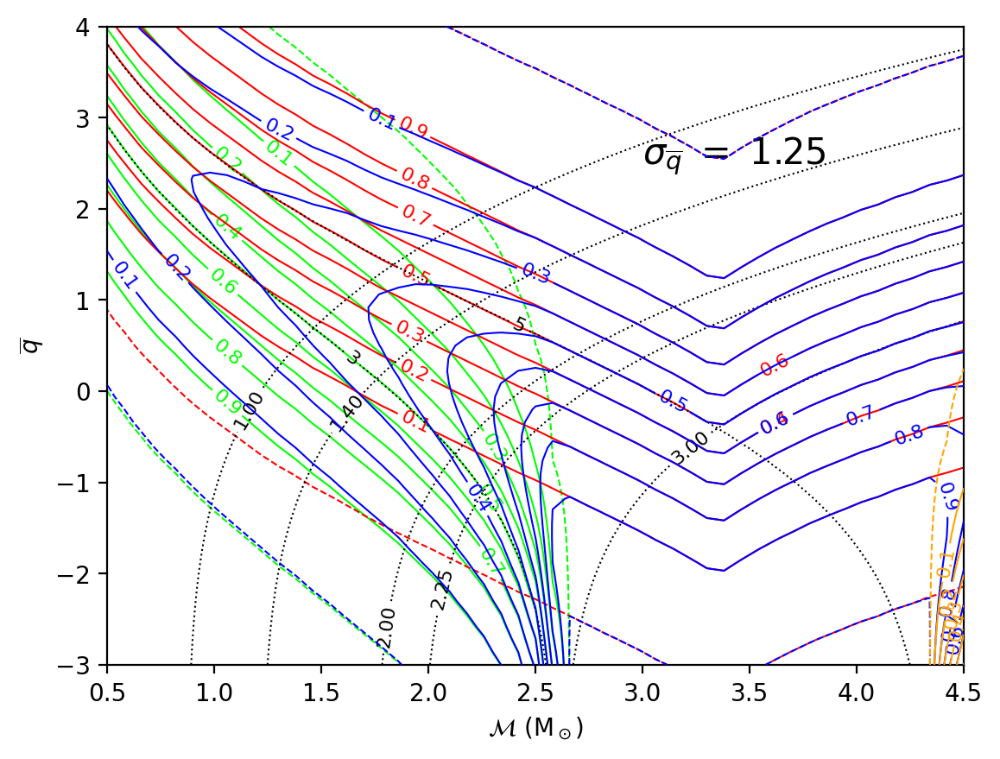

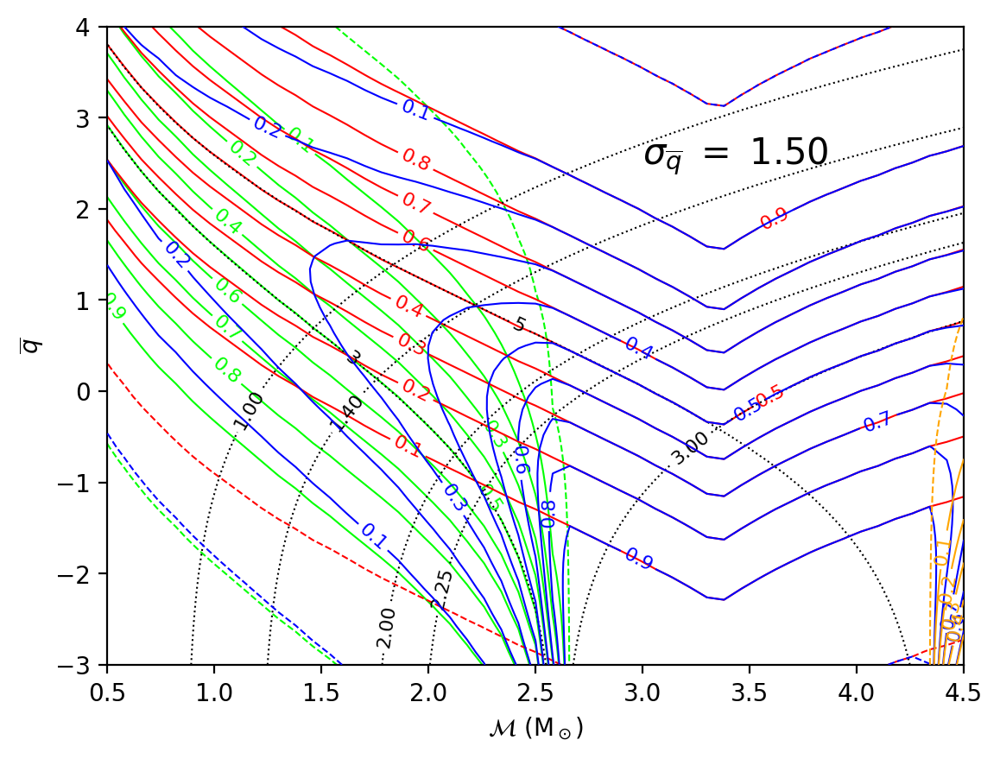

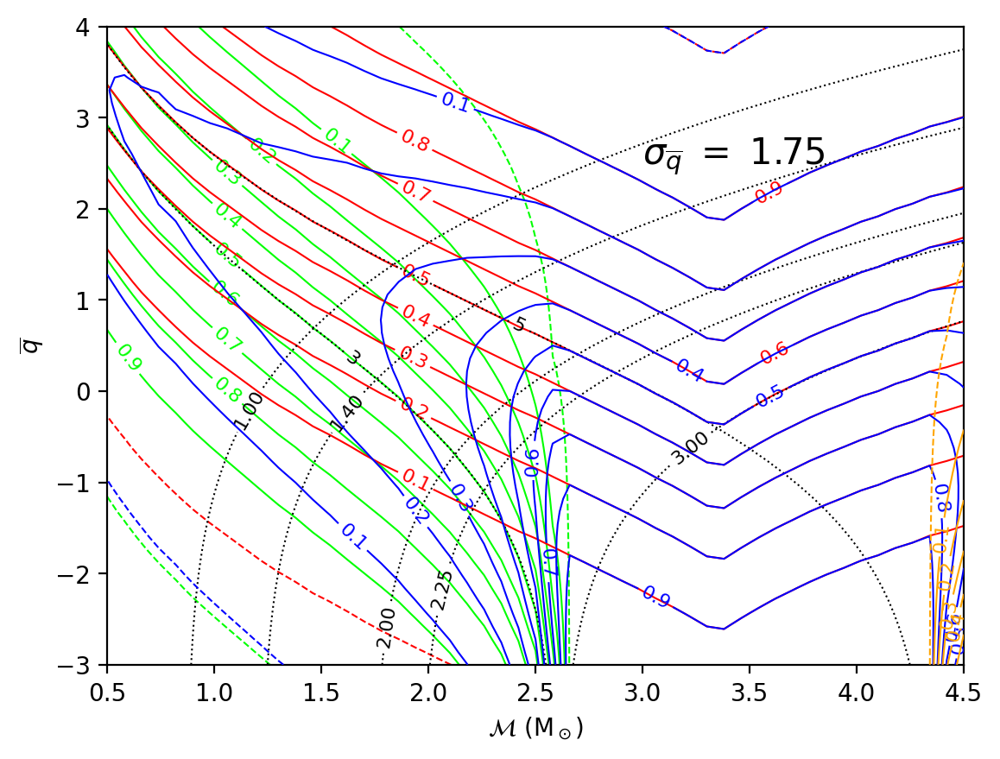

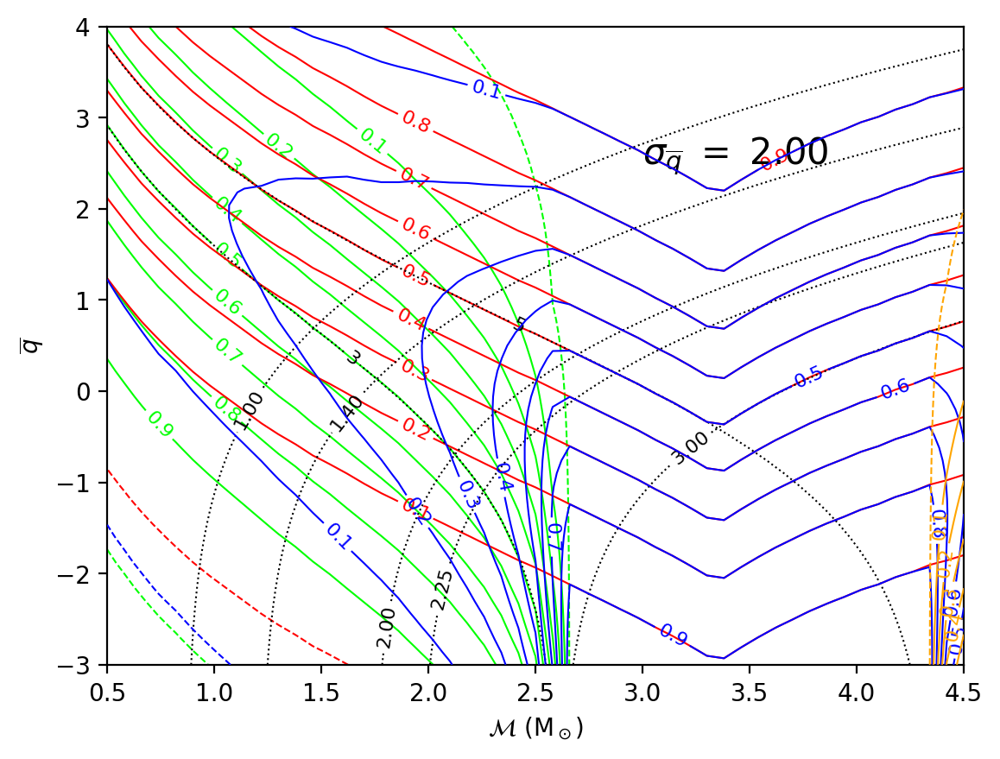

...

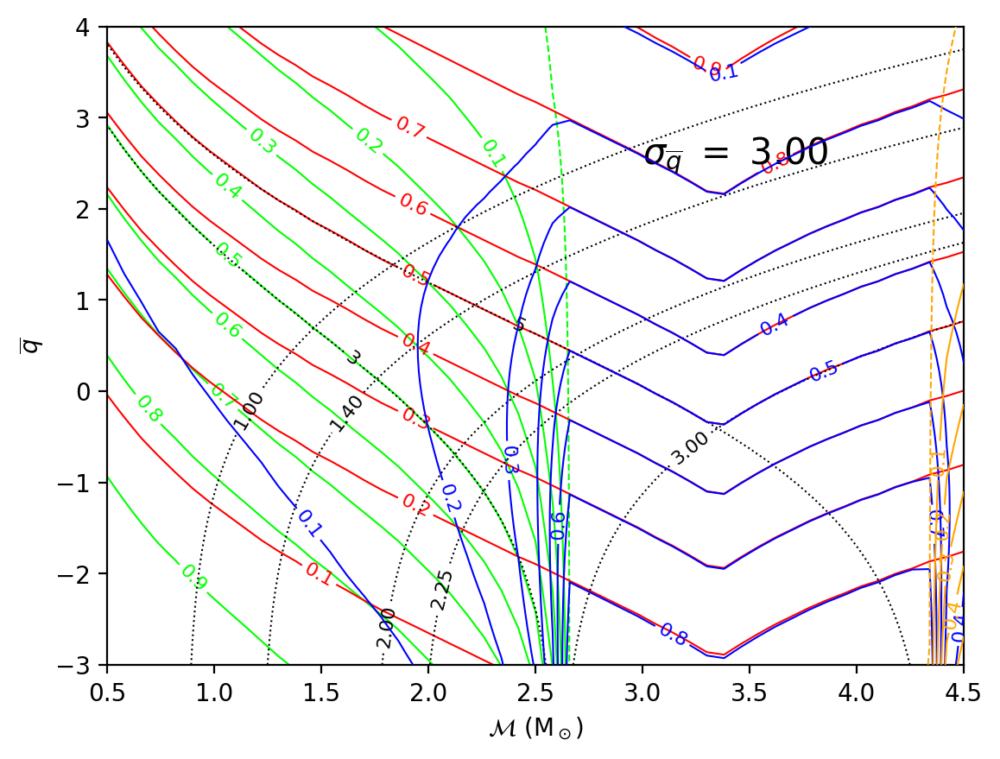

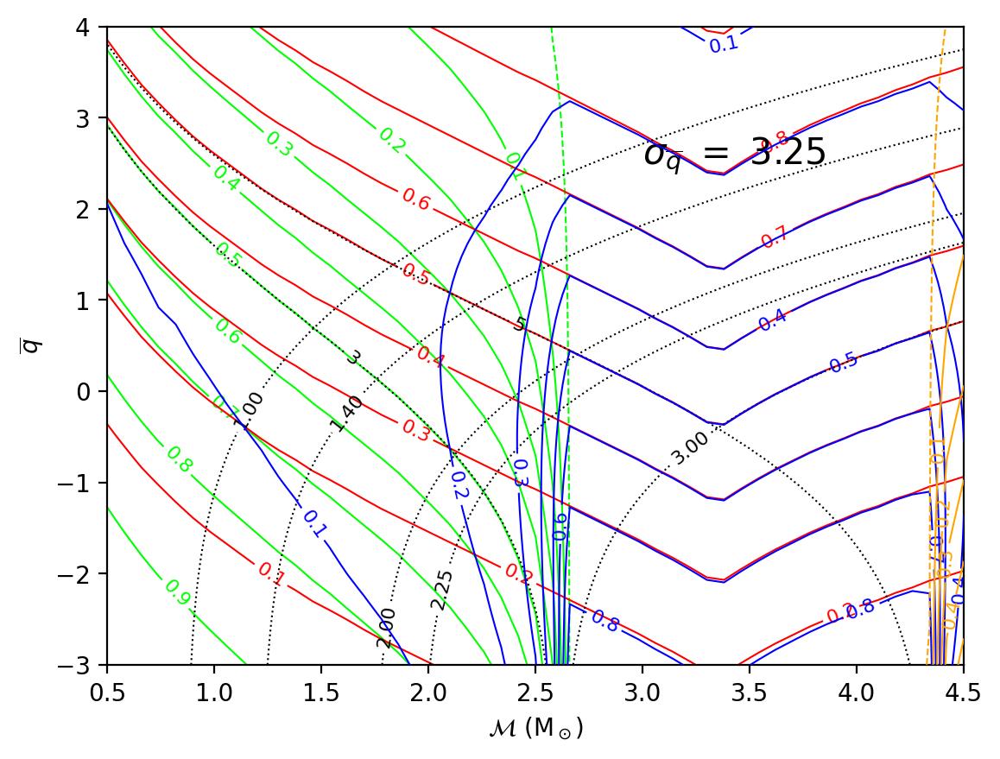

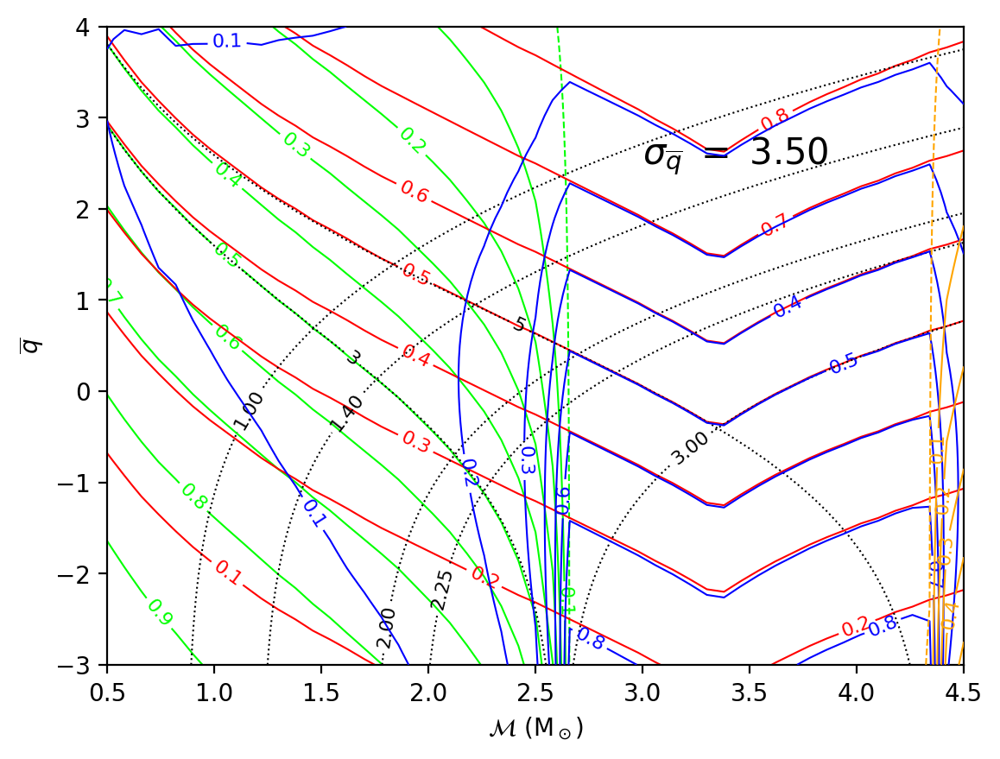

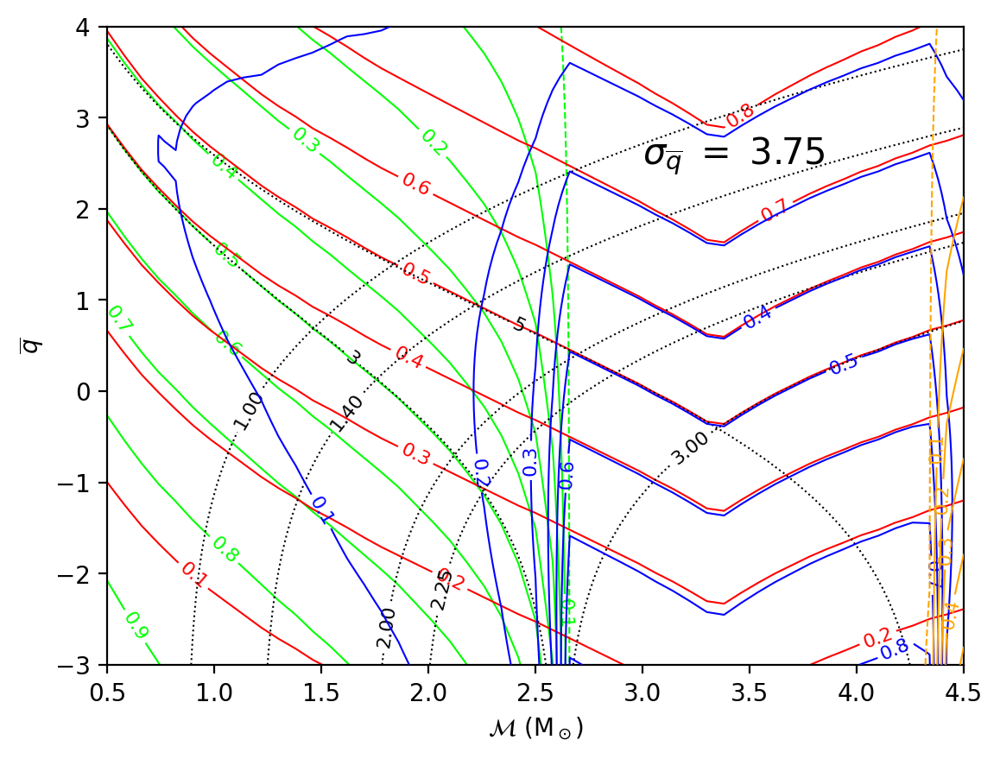

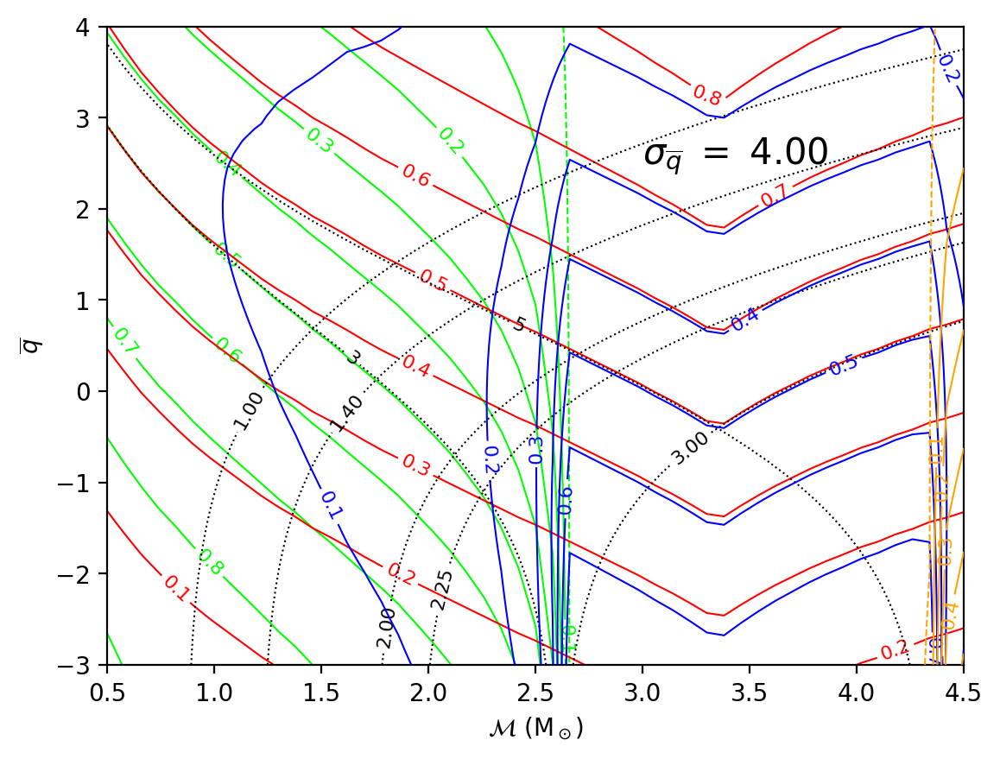

In [ ]:
# GENERAL MERGER PROBABILITY CONTOUR FIGURE

# loading chirp mass (e_mch) and mass ratio error (e_q) data
e_q_arr = original_df['e_q'].drop_duplicates().to_numpy()
e_mch = 0.05

# lists for figures
figs = []

# looping to create all plots for each e_q data
for e_q in e_q_arr:

  # loading data for the axes (chirp mass and q_bar)
  df = original_df.loc[original_df['e_q'] == e_q]
  mch_0 = df["mch_0"].drop_duplicates().to_numpy()
  q_0 = df["q_0"].drop_duplicates().to_numpy()

  # calculates m1 and m2 in terms of the axes
  n = int(math.sqrt(len(df)))
  q = np.array([math.exp(i)+1 for i in q_0])
  m1=mch_0*((1+q[:,np.newaxis])**0.2)*(q[:,np.newaxis]**0.4)
  m2=m1/q[:,np.newaxis]

  # plot properties
  fig, ax = plt.subplots()
  fig.dpi = 200
  plt.ylabel(r"$\overline{q}$")
  plt.xlabel(r"$\mathcal{M}$ (M$_\odot$)")
  ax.set_xlim([0.5,4.5])
  ax.set_ylim([-3,4])

  # draws contours of m1 and m2
  mass1_contour = ax.contour(mch_0,q_0,m1,[3,5],linestyles='dotted',colors='black',linewidths=0.75)
  mass2_contour = ax.contour(mch_0,q_0,m2,[1,1.4,2,2.25,3],linestyles='dotted',colors='black',linewidths=0.75)
  mass1_contour.clabel(mass1_contour.levels,inline=True,fontsize=8)
  mass2_contour.clabel(mass2_contour.levels,inline=True,fontsize=8)

  # changing merger probability data format for contour
  p_bns = np.empty([n,n])
  p_bhns = np.empty([n,n])
  p_gap = np.empty([n,n])
  p_bbh = np.empty([n,n])
  p_ns = np.empty([n,n])
  for i in range(n):
      p_bns[:][i] = df['p_bns'].loc[df['q_0'] == q_0[i]]
      p_bhns[:][i] = df['p_bhns'].loc[df['q_0'] == q_0[i]]
      p_gap[:][i] = df['p_gap'].loc[df['q_0'] == q_0[i]]
      p_bbh[:][i] = df['p_bbh'].loc[df['q_0'] == q_0[i]]
      p_ns[:][i] = df['p_ns'].loc[df['q_0'] == q_0[i]]

  # drawing merger contours for various probabilties
  solid_contour_range = np.arange(0.1,1.0,0.1)
  dotted_contour_range = [0.01,0.99]
  p_bns_contours = ax.contour(mch_0,q_0,p_bns,solid_contour_range,colors="lime",linewidths=0.75,zorder=-40)
  ax.contour(mch_0,q_0,p_bns,dotted_contour_range,colors="lime",linestyles="dashed",linewidths=0.75,zorder=-40)
  p_bns_contours.clabel(solid_contour_range,inline=True,fontsize=8,zorder=-40)

  p_bhns_contours = ax.contour(mch_0,q_0,p_bhns,solid_contour_range,colors="red",linewidths=0.75,zorder=-20)
  ax.contour(mch_0,q_0,p_bhns,dotted_contour_range,colors="red",linestyles="dashed",linewidths=0.75,zorder=-20)
  p_bhns_contours.clabel(solid_contour_range,inline=True,fontsize=8,zorder=-20)

  p_gap_contours = ax.contour(mch_0,q_0,p_gap,solid_contour_range,colors="blue",linewidths=0.75,zorder=20)
  ax.contour(mch_0,q_0,p_gap,dotted_contour_range,colors="blue",linestyles="dashed",linewidths=0.75,zorder=20)
  p_gap_contours.clabel(solid_contour_range,inline=True,fontsize=8,zorder=20)

  p_bbh_contours = ax.contour(mch_0,q_0,p_bbh,solid_contour_range,colors="orange",linewidths=0.75,zorder=40)
  ax.contour(mch_0,q_0,p_bbh,dotted_contour_range,colors="orange",linestyles="dashed",linewidths=0.75,zorder=40)
  p_bbh_contours.clabel(solid_contour_range,inline=True,fontsize=8,zorder=40)

  ax.text(3.0,2.5,r"$\sigma_{\overline{q}}$ $=$ " + str('{:.2f}'.format(e_q)),fontsize=15) # label for error in q
  figs.append(fig)

# saves figures in one pdf file
p = PdfPages("general_merger_probability_figures.pdf")
for fig in figs:
    fig.savefig(p, format='pdf')
p.close()

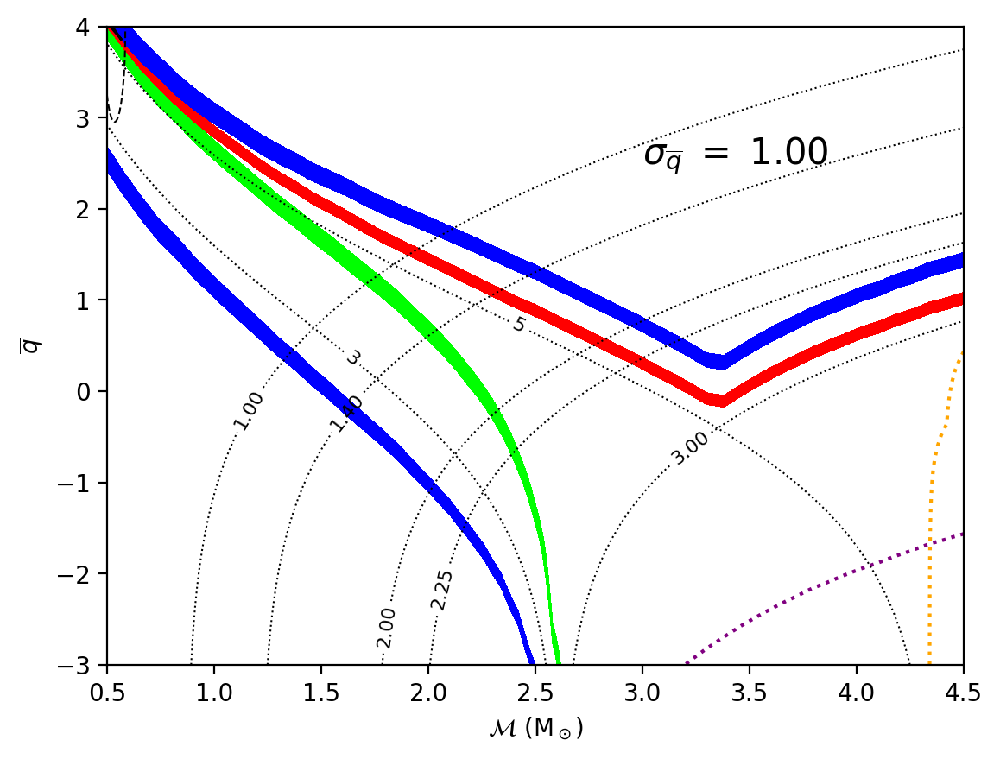

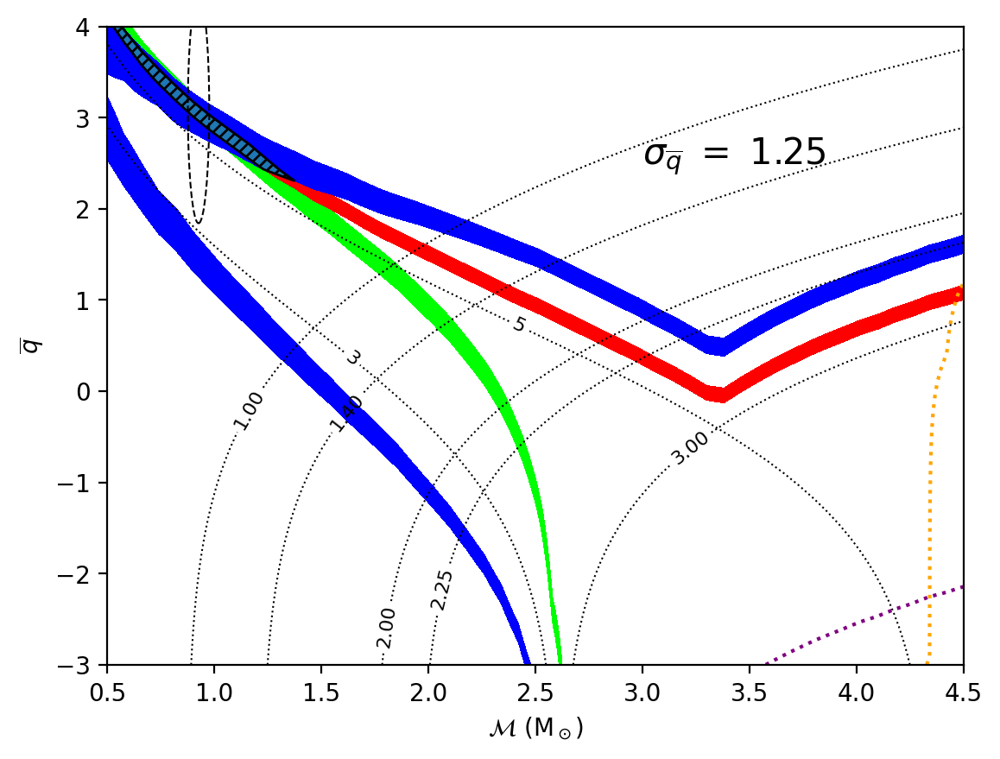

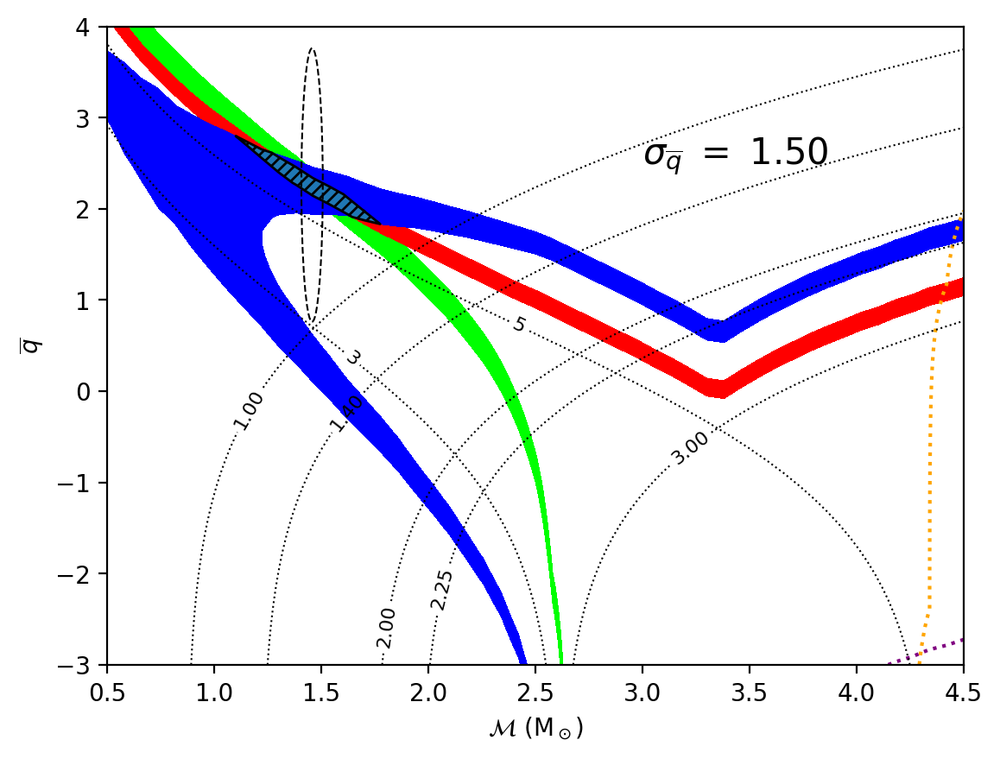

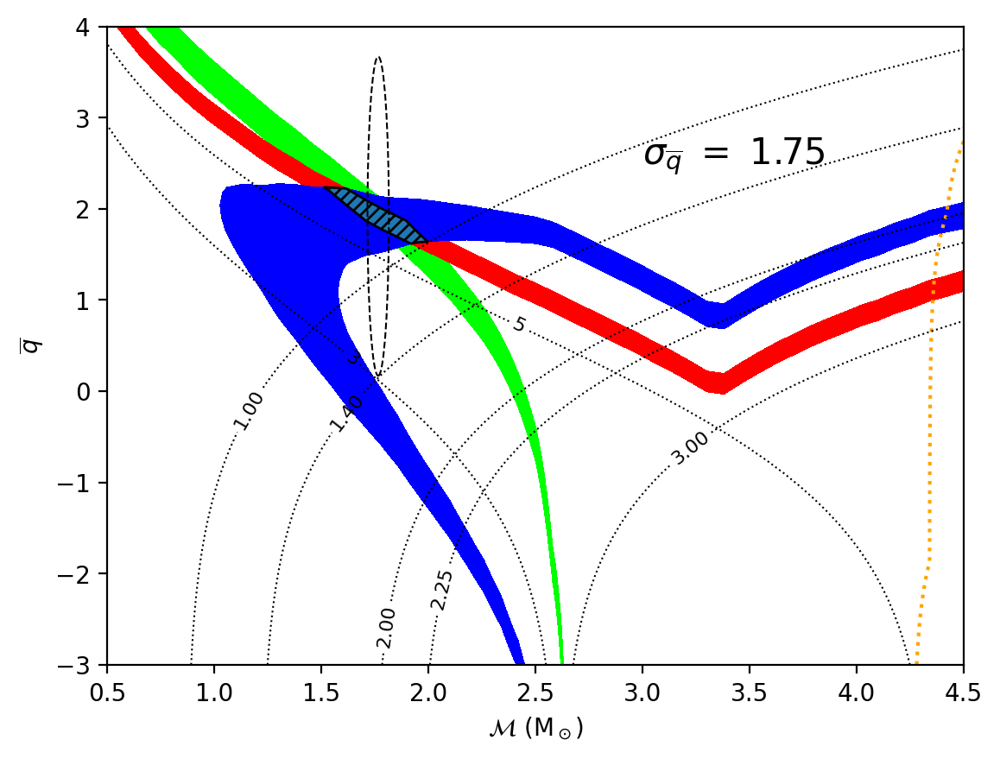

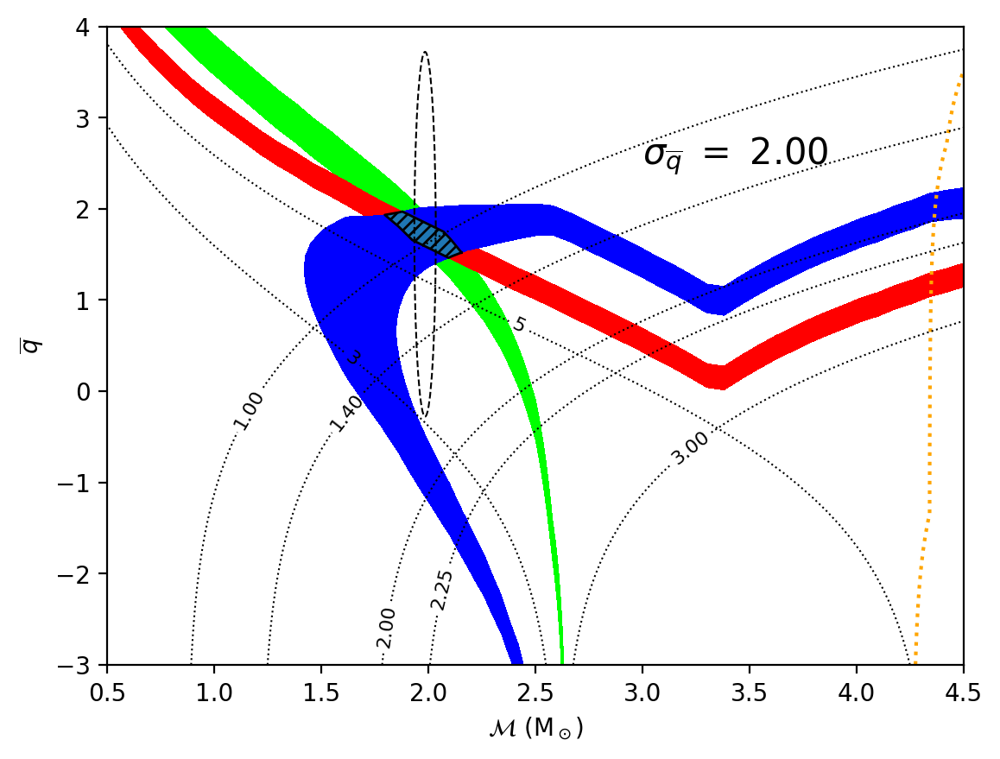

...

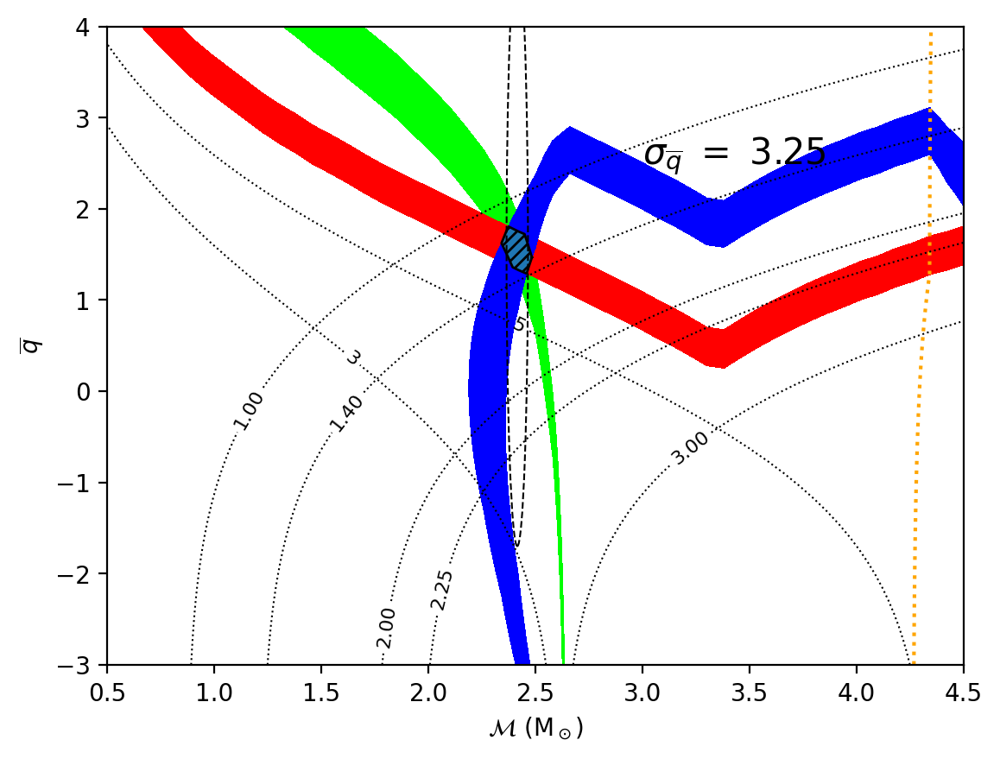

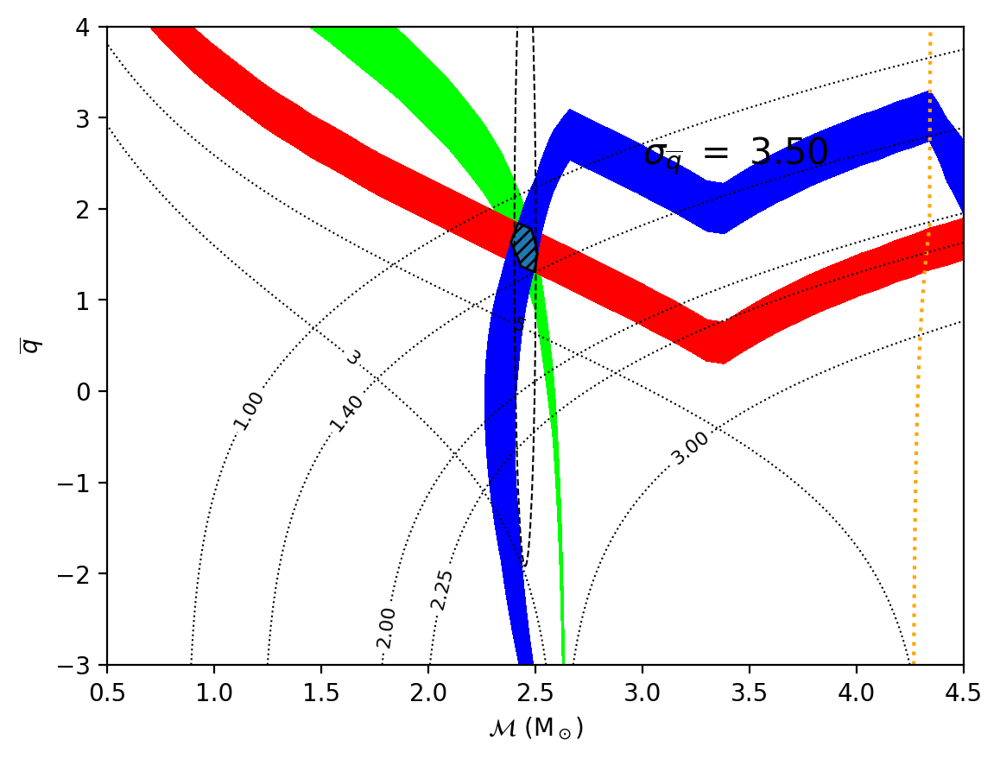

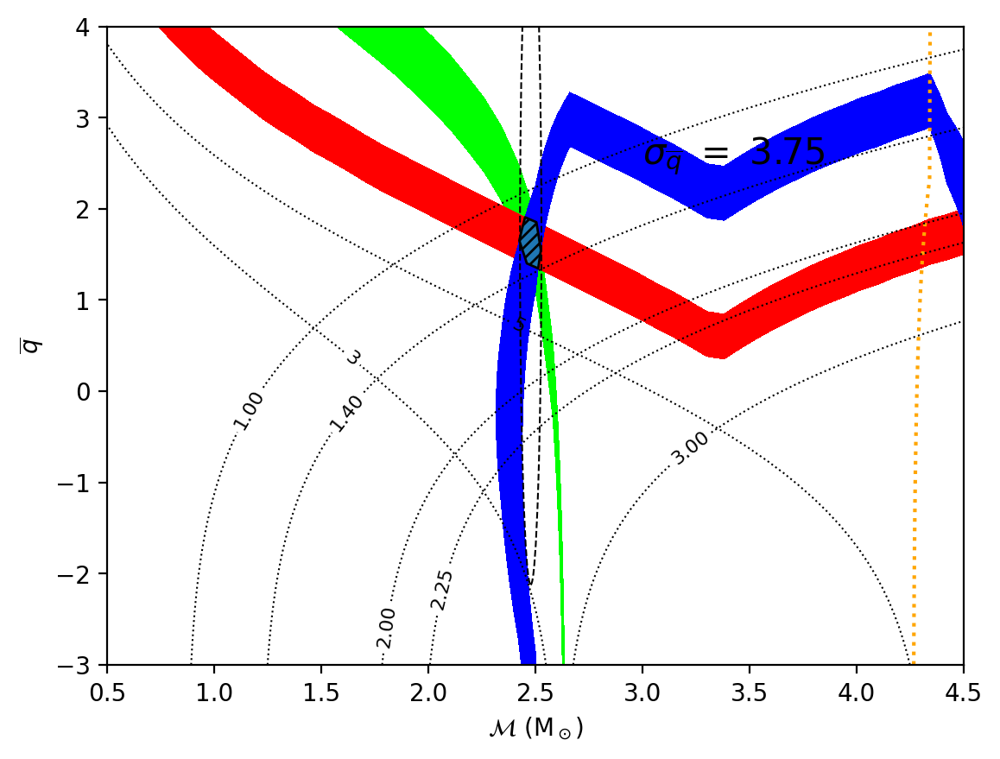

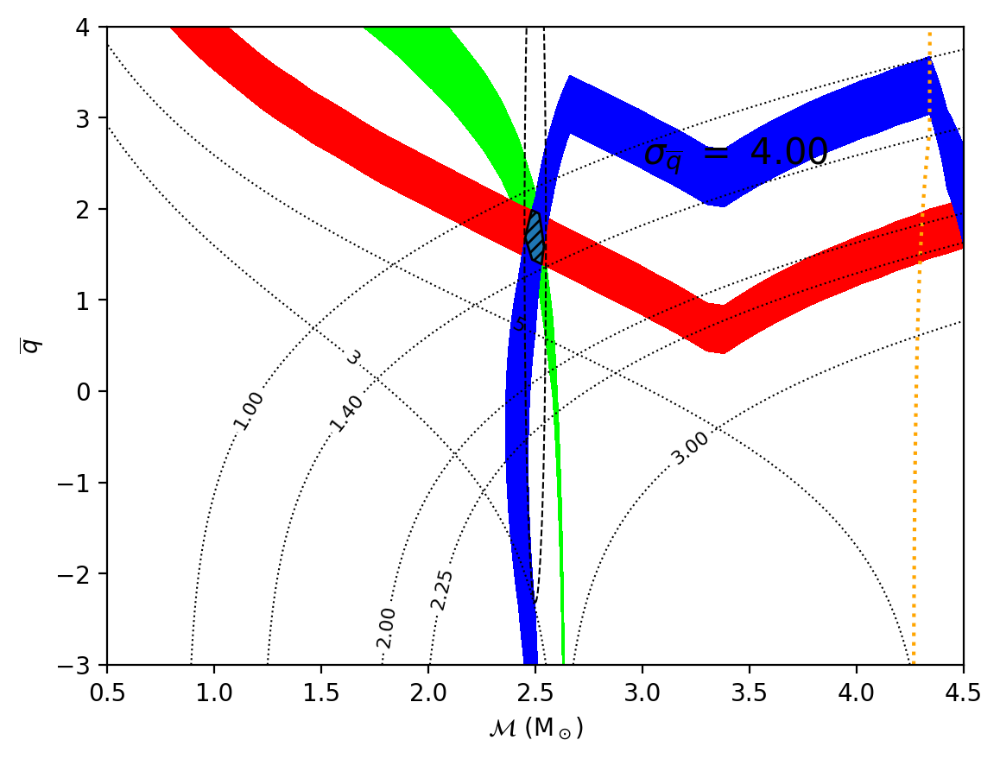

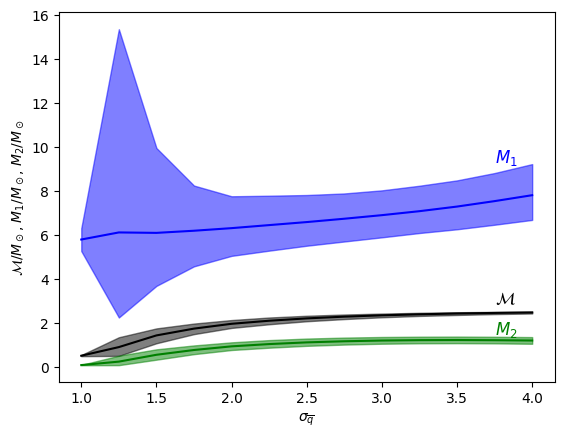

In [ ]:
# MERGER PROBABILITY CONTOUR PLOT IN MCH-Q SPACE
# INTERSECTION OF THREE CONTOURS (GW190426)

# method to create polygons of contours to calculate intersection of bands
def to_multipolygon(contour):
  if (contour is not None):
    polygons = list()
    for item in contour.collections:
      for i in item.get_paths():
        v = i.vertices
        x = v[:,0]
        y = v[:,1]
        polygons.append(Polygon([(i[0], i[1]) for i in zip(x,y)]))
    multipoly = so.unary_union(polygons)
    return multipoly

# loading chirp mass (e_mch) and mass ratio error (e_q) data
e_q_arr = original_df['e_q'].drop_duplicates().to_numpy()
e_mch = 0.05

# lists for figures and data
figs = []
mch_list, mch_max_list, mch_min_list = [], [], []
q_bar_list, q_bar_max_list, q_bar_min_list = [], [], []
e_q_intersection_list = []
intersection_list = []

# looping to create all plots for each e_q data
for e_q in e_q_arr:
  # loading data for the axes (chirp mass and q_bar)
  df = original_df.loc[original_df['e_q'] == e_q]
  mch_0 = df["mch_0"].drop_duplicates().to_numpy()
  q_0 = df["q_0"].drop_duplicates().to_numpy()

  # calculates m1 and m2 in terms of the axes
  n = int(math.sqrt(len(df)))
  m1 = np.empty([n,n])
  m2 = np.empty([n,n])
  q = np.array([math.exp(i)+1 for i in q_0])
  for i in range(n):
    for j in range(n):
      m1[i][j]=mch_0[j]*((1+q[i])**0.2)*(q[i]**0.4)
      m2[i][j]=m1[i][j]/q[i]

  # plot properties
  fig, ax = plt.subplots()
  fig.dpi = 200
  plt.ylabel(r"$\overline{q}$")
  plt.xlabel(r"$\mathcal{M}$ (M$_\odot$)")
  ax.set_xlim([0.5,4.5])
  ax.set_ylim([-3,4])

  # draws contours of m1 and m2
  mass1_contour = ax.contour(mch_0,q_0,m1,[3,5],linestyles='dotted',colors='black',linewidths=0.75,zorder=20)
  mass2_contour = ax.contour(mch_0,q_0,m2,[1,1.4,2,2.25,3],linestyles='dotted',colors='black',linewidths=0.75,zorder=20)
  mass1_contour.clabel(mass1_contour.levels,inline=True,fontsize=8)
  mass2_contour.clabel(mass2_contour.levels,inline=True,fontsize=8)

  # changing merger probability data format for contour
  p_bns = np.empty([n,n])
  p_bhns = np.empty([n,n])
  p_gap = np.empty([n,n])
  p_bbh = np.empty([n,n])
  p_ns = np.empty([n,n])
  for i in range(n):
      p_bns[:][i] = df['p_bns'].loc[df['q_0'] == q_0[i]]
      p_bhns[:][i] = df['p_bhns'].loc[df['q_0'] == q_0[i]]
      p_gap[:][i] = df['p_gap'].loc[df['q_0'] == q_0[i]]
      p_bbh[:][i] = df['p_bbh'].loc[df['q_0'] == q_0[i]]
      p_ns[:][i] = df['p_ns'].loc[df['q_0'] == q_0[i]]

  # creates bands for each merger probability
  prob_bands = [
      (p_bns, candidate_p_bns, 'lime'),
      (p_bhns, candidate_p_bhns, 'red'),
      (p_gap, candidate_p_gap, 'blue'),
      (p_bbh, candidate_p_bbh, 'orange'),
      (p_ns, candidate_p_ns, 'purple')
    ]

  erase_area = []
  if (mass_outer_limit>0): erase_area.append(ax.contourf(mch_0, q_0, m2, [0.0,mass_outer_limit], alpha=0))
  erase_area.append(ax.contourf(mch_0, q_0, m2, [ns_mass_limit,5], alpha=0))

  polygons = []
  for p_values, candidate_prob, color in prob_bands:
    if candidate_prob < 0.025:
      if candidate_prob == 0: candidate_prob = 0.001
      contour = ax.contour(mch_0, q_0, p_values, [candidate_prob], colors=color, linestyles='dotted')
    elif candidate_prob == 1:
      candidate_prob = 0.999
      contour = ax.contour(mch_0, q_0, p_values, [candidate_prob], colors=color, linestyles='dotted')
    else:
      contour = ax.contourf(mch_0, q_0, p_values, [candidate_prob - 0.025, candidate_prob + 0.025], colors=color)
      polygons.append(to_multipolygon(contour))
      intersection_length = len(polygons)

  # calculating intersection
  for i in range(intersection_length):
    for j in range(i+1,intersection_length):
      for k in range(j+1,intersection_length):
        p1 = polygons[i]
        p2 = polygons[j]
        p3 = polygons[k]
        if (p1 is not None and p2 is not None and p3 is not None):
          contour_intersect = shapely.intersection(p1,p2)

          if not contour_intersect.is_empty: contour_intersect = shapely.intersection(contour_intersect,p3)
          else: continue

          for area in erase_area:
            if not contour_intersect.is_empty: contour_intersect = contour_intersect.difference(to_multipolygon(area))
            else: break

          if not contour_intersect.is_empty:
            if (contour_intersect.geom_type == "MultiPolygon"):
              contour_intersect = shapely.concave_hull(contour_intersect)
            plt.fill_between(*contour_intersect.exterior.xy,hatch="/////")
            plt.plot(*contour_intersect.exterior.xy,color="black",linewidth=1)
            centroid = contour_intersect.centroid
            ellipse = mpl.patches.Ellipse([centroid.x,centroid.y], width=2*e_mch, height=2*e_q,linewidth=0.75,linestyle='dashed',facecolor='none',edgecolor='black',zorder=20)
            ax.add_patch(ellipse)

            bounds = contour_intersect.bounds
            mch_list.append(centroid.x)
            mch_min_list.append(bounds[0])
            mch_max_list.append(bounds[2])
            q_bar_list.append(centroid.y)
            q_bar_min_list.append(bounds[1])
            q_bar_max_list.append(bounds[3])
            e_q_intersection_list.append(e_q)
            intersection_list.append(contour_intersect)

  # appends figure to list of figures
  ax.text(3.0,2.5,r"$\sigma_{\overline{q}}$ $=$ " + str('{:.2f}'.format(e_q)),fontsize=15) # label for error in q
  figs.append(fig)

# saves figures in one pdf file
p = PdfPages(url[-16:-4] + "_" + signal_name+ "_ver20230724" + ".pdf")
for fig in figs:
    fig.savefig(p, format='pdf')

# MASSES VS E_Q PLOT

estimation_length = len(e_q_intersection_list)
if (estimation_length > 0):
  # processing data from previous figures to mass ratio, m1, and m2
  fig, ax = plt.subplots()
  # processing q values and their errors
  q_list = [math.exp(q_bar_list[i])+1 for i in range(estimation_length)]
  q_max_list = [math.exp(q_bar_max_list[i])+1 for i in range(estimation_length)]
  q_min_list = [math.exp(q_bar_min_list[i])+1 for i in range(estimation_length)]
  # processing m1 values and their errors
  m1_list = [mch_list[i]*((1+q_list[i])**0.2)*(q_list[i]**0.4) for i in range(estimation_length)]
  m1_max_list = [mch_max_list[i]*((1+q_max_list[i])**0.2)*(q_max_list[i]**0.4) for i in range(estimation_length)]
  m1_min_list = [mch_min_list[i]*((1+q_min_list[i])**0.2)*(q_min_list[i]**0.4) for i in range(estimation_length)]
  # processing m2 values and their errors
  m2_list = [m1_list[i]/q_list[i] for i in range(estimation_length)]
  m2_max_list = [mch_max_list[i]*((1+q_min_list[i])**0.2)*(q_min_list[i]**-0.6) for i in range(estimation_length)]
  m2_min_list = [mch_min_list[i]*((1+q_max_list[i])**0.2)*(q_max_list[i]**-0.6) for i in range(estimation_length)]

  # plotting all values of interest (chirp mass, m1, and m2) and regions representing their error
  # plotting chirp mass
  plt.plot(e_q_intersection_list,mch_list,color="black")
  plt.fill_between(e_q_intersection_list,mch_min_list,mch_max_list,color="black",alpha=0.5)
  plt.text(e_q_intersection_list[estimation_length-2],2.9,r"$\mathcal{M}$",fontsize=12,color="black")
  # plotting m1
  plt.plot(e_q_intersection_list,m1_list,color="blue")
  plt.fill_between(e_q_intersection_list,m1_min_list,m1_max_list,color="blue",alpha=0.5)
  plt.text(e_q_intersection_list[estimation_length-2],9.3,r"$M_1$",fontsize=12,color="blue")
  # plotting m2
  plt.plot(e_q_intersection_list,m2_list,color="green")
  plt.fill_between(e_q_intersection_list,m2_min_list,m2_max_list,color="green",alpha=0.5)
  plt.text(e_q_intersection_list[estimation_length-2],1.5,r"$M_2$",fontsize=12,color="green")

  # plot properties and saving in PDF containing all figures of the event
  plt.ylabel(r"$\mathcal{M}/M_\odot$, $M_1/M_\odot$, $M_2/M_\odot$")
  plt.xlabel(r"$\sigma_{\overline{q}}$")
  fig.savefig(p, format='pdf')
p.close()

/usr/local/lib/python3.10/dist-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)


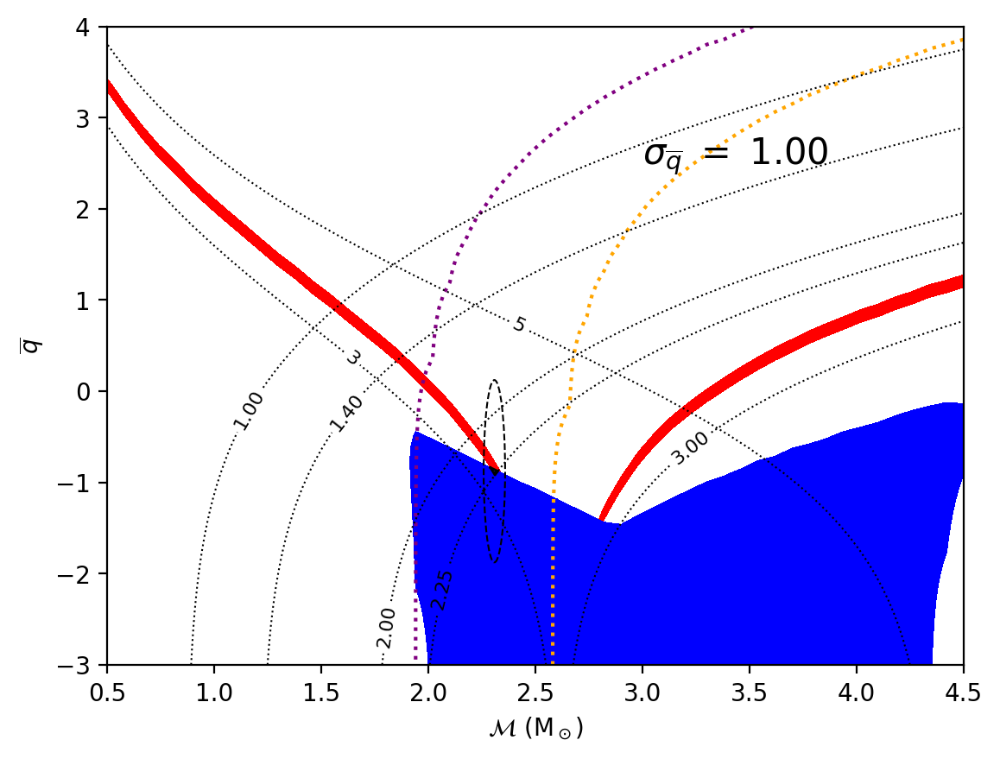

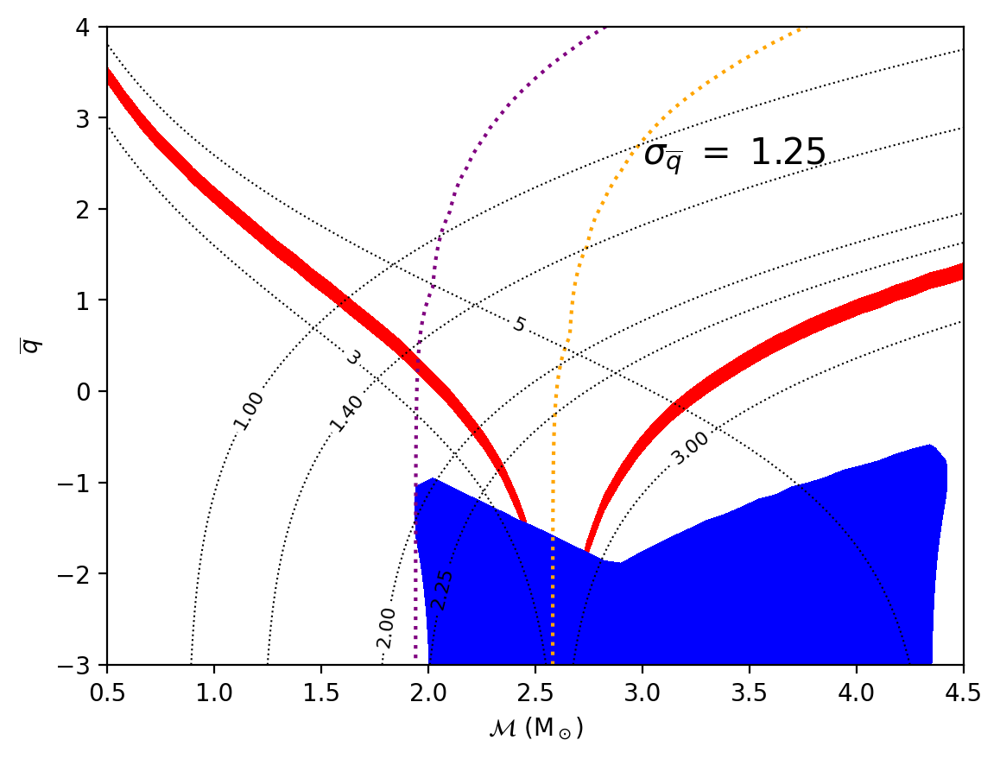

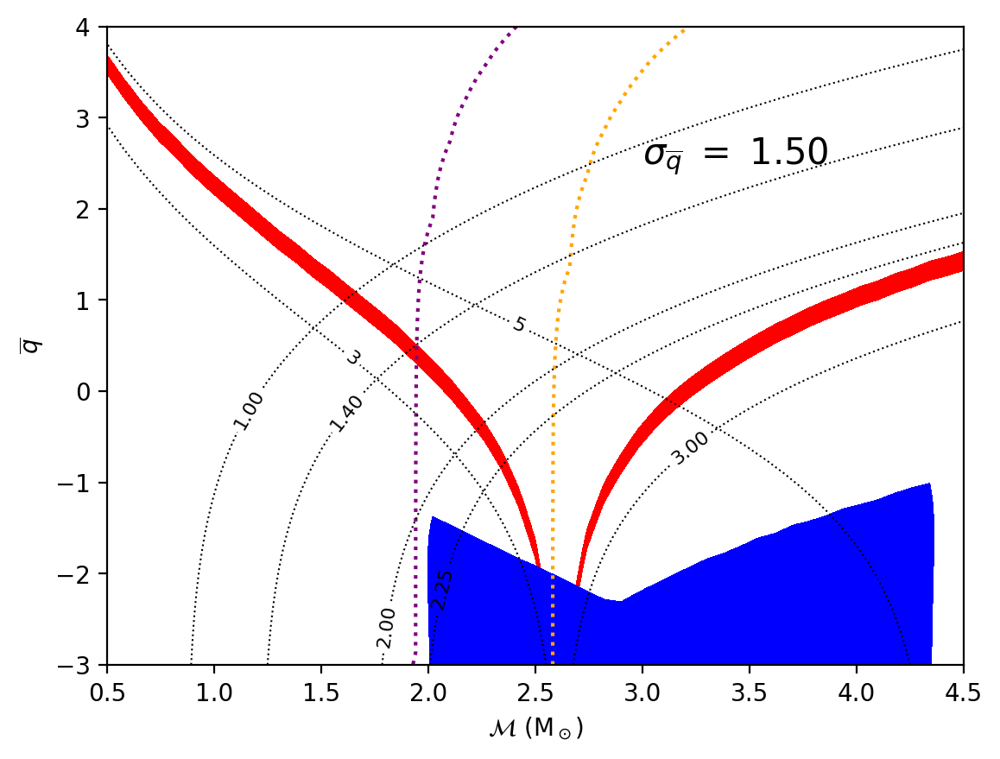

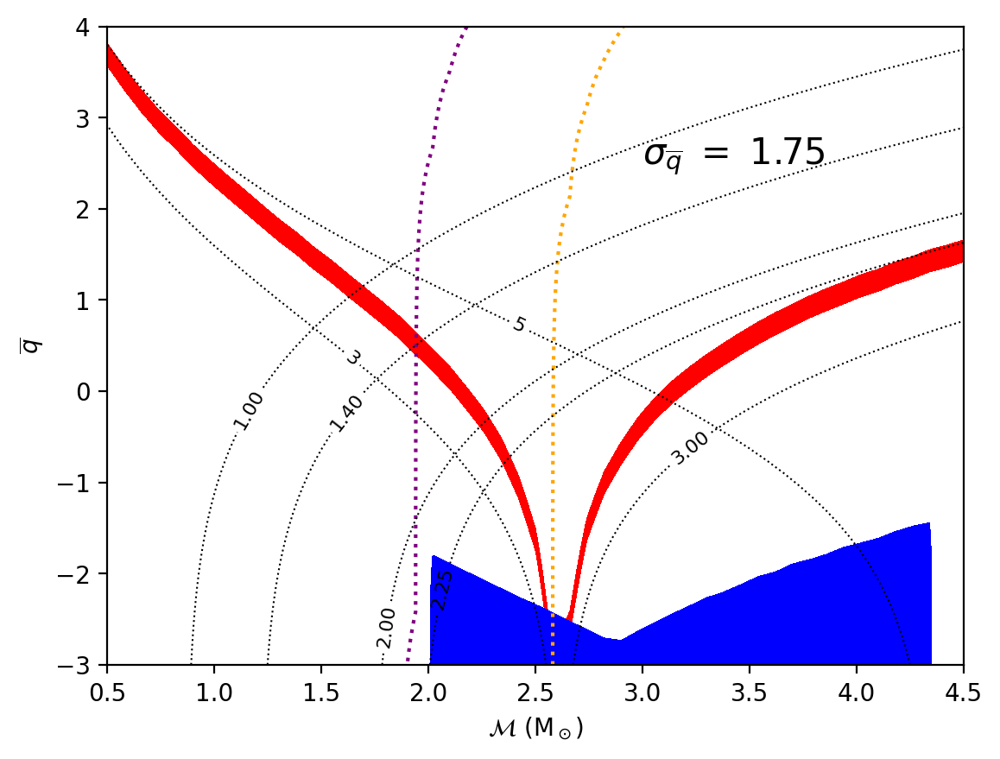

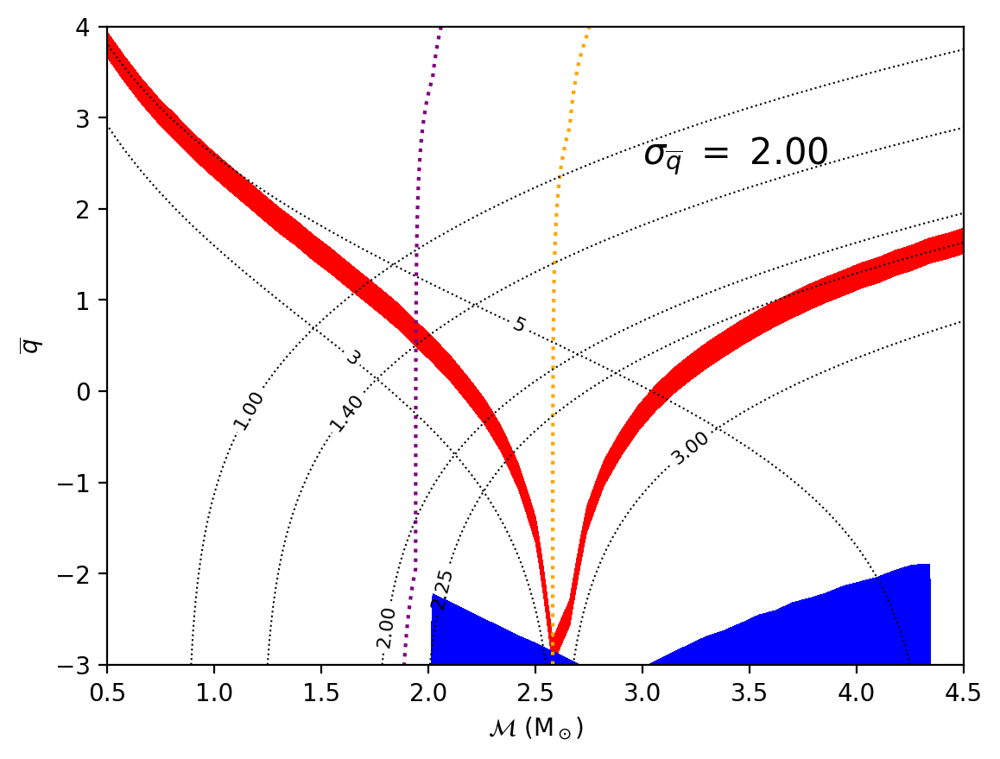

...

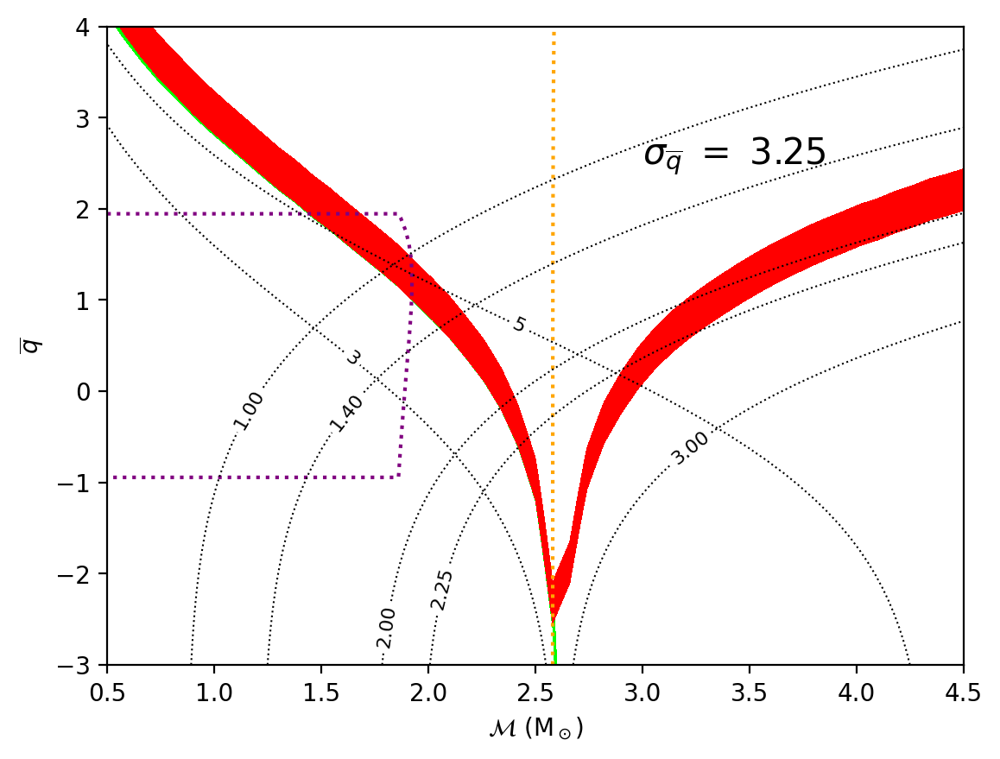

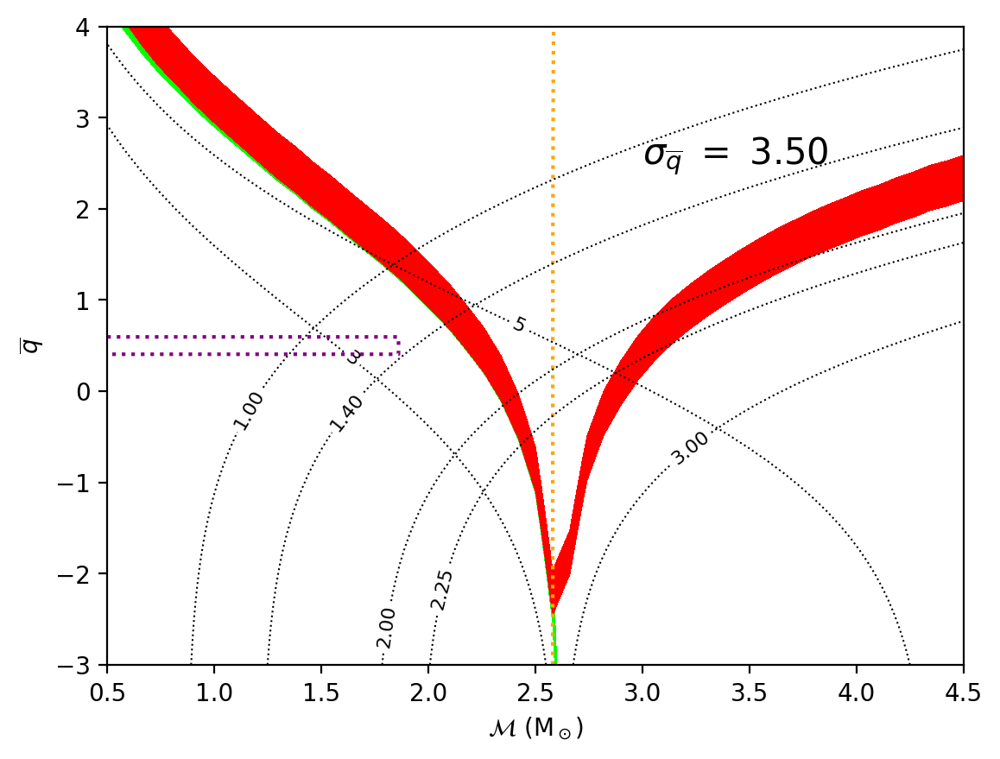

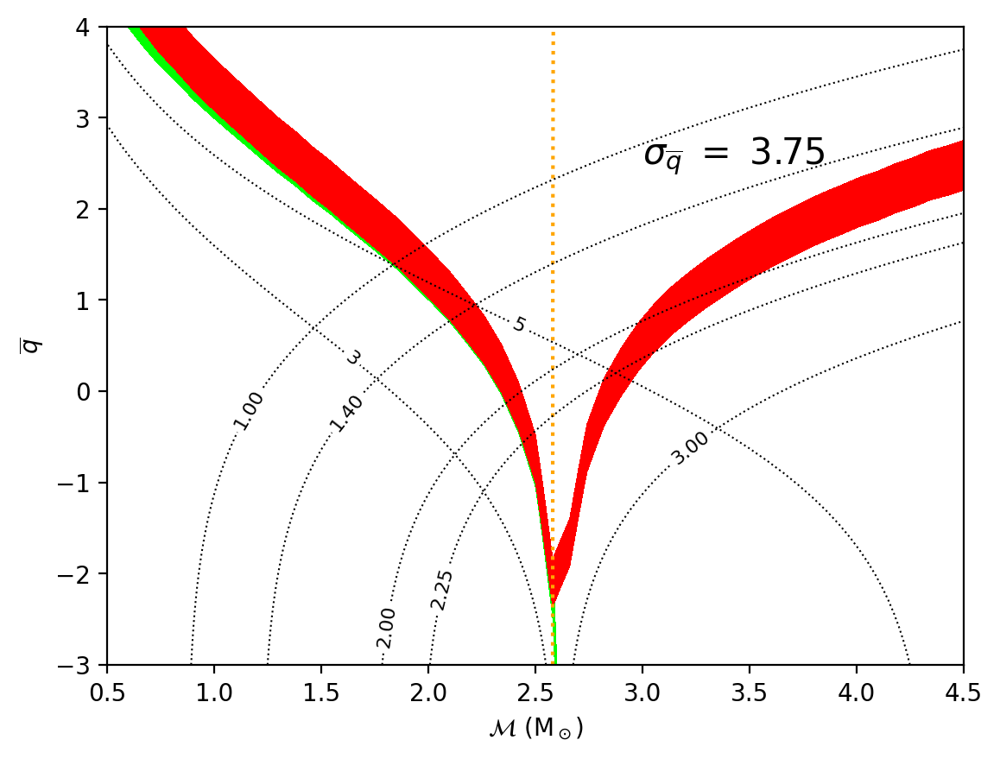

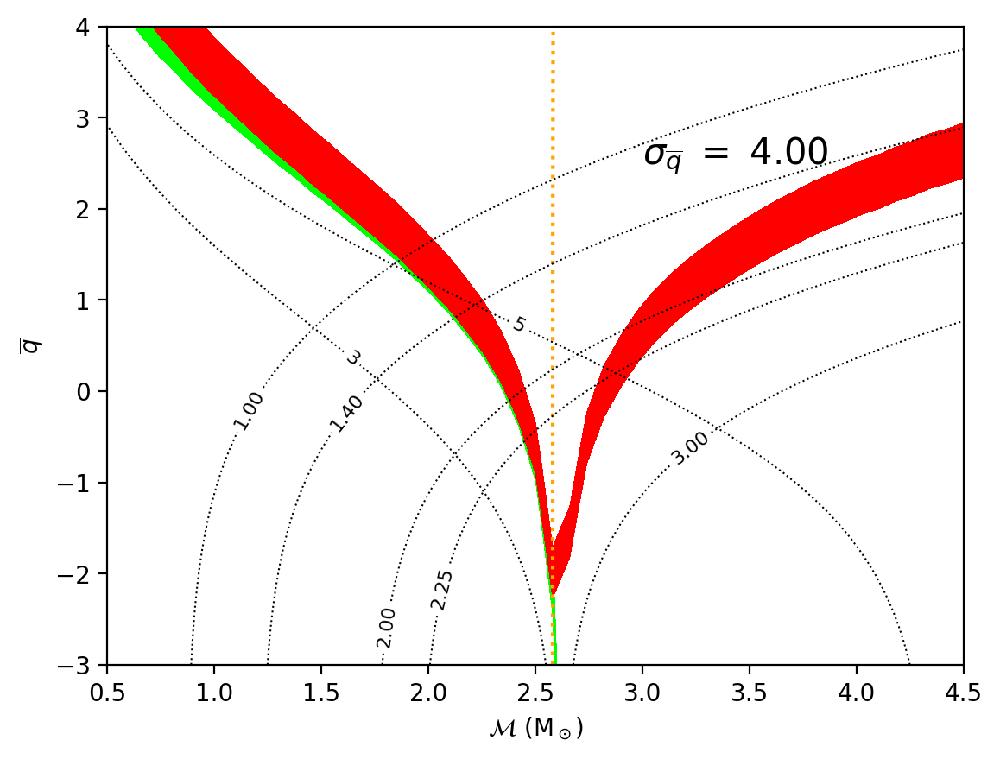

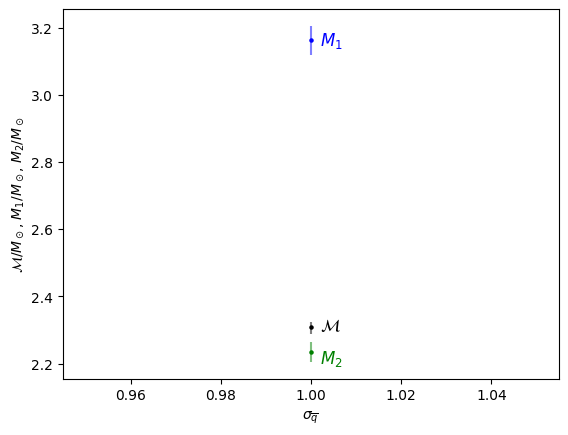

In [ ]:
# MERGER PROBABILITY CONTOUR PLOT IN MCH-Q SPACE
# INTERSECTION OF THREE CONTOURS (S230529ay)

# method to create polygons of contours to calculate intersection of bands
def to_multipolygon(contour):
  if (contour is not None):
    polygons = list()
    for item in contour.collections:
      for i in item.get_paths():
        v = i.vertices
        x = v[:,0]
        y = v[:,1]
        polygons.append(Polygon([(i[0], i[1]) for i in zip(x,y)]))
    multipoly = so.unary_union(polygons)
    return multipoly

# loading chirp mass (e_mch) and mass ratio error (e_q) data
e_q_arr = original_df['e_q'].drop_duplicates().to_numpy()
e_mch = 0.05

# lists for figures and data
figs = []
mch_list, mch_max_list, mch_min_list = [], [], []
q_bar_list, q_bar_max_list, q_bar_min_list = [], [], []
e_q_intersection_list = []
intersection_list = []

# looping to create all plots for each e_q data
for e_q in e_q_arr:
  # loading data for the axes (chirp mass and q_bar)
  df = original_df.loc[original_df['e_q'] == e_q]
  mch_0 = df["mch_0"].drop_duplicates().to_numpy()
  q_0 = df["q_0"].drop_duplicates().to_numpy()

  # calculates m1 and m2 in terms of the axes
  n = int(math.sqrt(len(df)))
  m1 = np.empty([n,n])
  m2 = np.empty([n,n])
  q = np.array([math.exp(i)+1 for i in q_0])
  for i in range(n):
    for j in range(n):
      m1[i][j]=mch_0[j]*((1+q[i])**0.2)*(q[i]**0.4)
      m2[i][j]=m1[i][j]/q[i]

  # plot properties
  fig, ax = plt.subplots()
  fig.dpi = 200
  plt.ylabel(r"$\overline{q}$")
  plt.xlabel(r"$\mathcal{M}$ (M$_\odot$)")
  ax.set_xlim([0.5,4.5])
  ax.set_ylim([-3,4])

  # draws contours of m1 and m2
  mass1_contour = ax.contour(mch_0,q_0,m1,[3,5],linestyles='dotted',colors='black',linewidths=0.75,zorder=20)
  mass2_contour = ax.contour(mch_0,q_0,m2,[1,1.4,2,2.25,3],linestyles='dotted',colors='black',linewidths=0.75,zorder=20)
  mass1_contour.clabel(mass1_contour.levels,inline=True,fontsize=8)
  mass2_contour.clabel(mass2_contour.levels,inline=True,fontsize=8)

  # changing merger probability data format for contour
  p_bns = np.empty([n,n])
  p_bhns = np.empty([n,n])
  p_gap = np.empty([n,n])
  p_bbh = np.empty([n,n])
  p_ns = np.empty([n,n])
  for i in range(n):
      p_bns[:][i] = df['p_bns'].loc[df['q_0'] == q_0[i]]
      p_bhns[:][i] = df['p_bhns'].loc[df['q_0'] == q_0[i]]
      p_gap[:][i] = df['p_gap'].loc[df['q_0'] == q_0[i]]
      p_bbh[:][i] = df['p_bbh'].loc[df['q_0'] == q_0[i]]
      p_ns[:][i] = df['p_ns'].loc[df['q_0'] == q_0[i]]

  # creates bands for each merger probability
  prob_bands = [
      (p_bns, candidate_p_bns, 'lime'),
      (p_bhns, candidate_p_bhns, 'red'),
      (p_gap, candidate_p_gap, 'blue'),
      (p_bbh, candidate_p_bbh, 'orange'),
      (p_ns, candidate_p_ns, 'purple')
    ]

  erase_area = []
  if (mass_outer_limit>0): erase_area.append(ax.contourf(mch_0, q_0, m2, [0.0,mass_outer_limit], alpha=0))
  erase_area.append(ax.contourf(mch_0, q_0, m2, [ns_mass_limit,5], alpha=0))
  erase_area.append(ax.contourf(mch_0, q_0, p_ns, [0.999,1.0], alpha=0)) # for constraints 8

  polygons = []
  for p_values, candidate_prob, color in prob_bands:
    if candidate_prob < 0.025:
      if candidate_prob == 0: candidate_prob = 0.001
      contour = ax.contour(mch_0, q_0, p_values, [candidate_prob], colors=color, linestyles='dotted')
    elif candidate_prob == 1:
      candidate_prob = 0.999
      contour = ax.contour(mch_0, q_0, p_values, [candidate_prob], colors=color, linestyles='dotted')
    else:
      contour = ax.contourf(mch_0, q_0, p_values, [candidate_prob - 0.025, candidate_prob + 0.025], colors=color)
      polygons.append(to_multipolygon(contour))
      intersection_length = len(polygons)

  # calculating intersection
  for i in range(intersection_length):
    for j in range(i+1,intersection_length):
      for k in range(j+1,intersection_length):
        p1 = polygons[i]
        p2 = polygons[j]
        p3 = polygons[k]
        if (p1 is not None and p2 is not None and p3 is not None):
          contour_intersect = shapely.intersection(p1,p2)

          if not contour_intersect.is_empty: contour_intersect = shapely.intersection(contour_intersect,p3)
          else: continue

          for area in erase_area:
            if not contour_intersect.is_empty: contour_intersect = contour_intersect.difference(to_multipolygon(area))
            else: break

          if not contour_intersect.is_empty:
            if (contour_intersect.geom_type == "MultiPolygon"):
              contour_intersect = shapely.concave_hull(contour_intersect)
            plt.fill_between(*contour_intersect.exterior.xy,hatch="/////")
            plt.plot(*contour_intersect.exterior.xy,color="black",linewidth=1)
            centroid = contour_intersect.centroid
            ellipse = mpl.patches.Ellipse([centroid.x,centroid.y], width=2*e_mch, height=2*e_q,linewidth=0.75,linestyle='dashed',facecolor='none',edgecolor='black',zorder=20)
            ax.add_patch(ellipse)

            bounds = contour_intersect.bounds
            mch_list.append(centroid.x)
            mch_min_list.append(bounds[0])
            mch_max_list.append(bounds[2])
            q_bar_list.append(centroid.y)
            q_bar_min_list.append(bounds[1])
            q_bar_max_list.append(bounds[3])
            e_q_intersection_list.append(e_q)
            intersection_list.append(contour_intersect)

  # appends figure to list of figures
  ax.text(3.0,2.5,r"$\sigma_{\overline{q}}$ $=$ " + str('{:.2f}'.format(e_q)),fontsize=15) # label for error in q
  figs.append(fig)

# saves figures in one pdf file
p = PdfPages(url[-16:-4] + "_" + signal_name+ "_ver20230724" + ".pdf")
for fig in figs:
    fig.savefig(p, format='pdf')

# MASSES VS E_Q PLOT

estimation_length = len(e_q_intersection_list)
if (estimation_length > 0):
  # processing data from previous figures to mass ratio, m1, and m2
  fig, ax = plt.subplots()
  # processing q values and their errors
  q_list = [math.exp(q_bar_list[i])+1 for i in range(estimation_length)]
  q_max_list = [math.exp(q_bar_max_list[i])+1 for i in range(estimation_length)]
  q_min_list = [math.exp(q_bar_min_list[i])+1 for i in range(estimation_length)]
  # processing m1 values and their errors
  m1_list = [mch_list[i]*((1+q_list[i])**0.2)*(q_list[i]**0.4) for i in range(estimation_length)]
  m1_max_list = [mch_max_list[i]*((1+q_max_list[i])**0.2)*(q_max_list[i]**0.4) for i in range(estimation_length)]
  m1_min_list = [mch_min_list[i]*((1+q_min_list[i])**0.2)*(q_min_list[i]**0.4) for i in range(estimation_length)]
  # processing m2 values and their errors
  m2_list = [m1_list[i]/q_list[i] for i in range(estimation_length)]
  m2_max_list = [mch_max_list[i]*((1+q_min_list[i])**0.2)*(q_min_list[i]**-0.6) for i in range(estimation_length)]
  m2_min_list = [mch_min_list[i]*((1+q_max_list[i])**0.2)*(q_max_list[i]**-0.6) for i in range(estimation_length)]

  # plotting all values of interest (chirp mass, m1, and m2) and regions representing their error
  # plotting chirp mass
  plt.scatter(e_q_intersection_list,mch_list,color="black",s=5)
  plt.errorbar(e_q_intersection_list,mch_list,yerr=[[mch_list[0]-mch_min_list[0]],[mch_max_list[0]-mch_list[0]]],color="black",alpha=0.5)
  plt.text(e_q_intersection_list[estimation_length-2]+0.002,2.3,r"$\mathcal{M}$",fontsize=12,color="black")
  # plotting m1
  plt.scatter(e_q_intersection_list,m1_list,color="blue",s=5)
  plt.errorbar(e_q_intersection_list,m1_list,yerr=[[m1_list[0]-m1_min_list[0]],[m1_max_list[0]-m1_list[0]]],color="blue",alpha=0.5)
  plt.text(e_q_intersection_list[estimation_length-2]+0.002,3.15,r"$M_1$",fontsize=12,color="blue")
  # plotting m2
  plt.scatter(e_q_intersection_list,m2_list,color="green",s=5)
  plt.errorbar(e_q_intersection_list,m2_list,yerr=[[m2_list[0]-m2_min_list[0]],[m2_max_list[0]-m2_list[0]]],color="green",alpha=0.5)
  plt.text(e_q_intersection_list[estimation_length-2]+0.002,2.2,r"$M_2$",fontsize=12,color="green")

  # plot properties and saving in PDF containing all figures of the event
  plt.ylabel(r"$\mathcal{M}/M_\odot$, $M_1/M_\odot$, $M_2/M_\odot$")
  plt.xlabel(r"$\sigma_{\overline{q}}$")
  fig.savefig(p, format='pdf')
p.close()

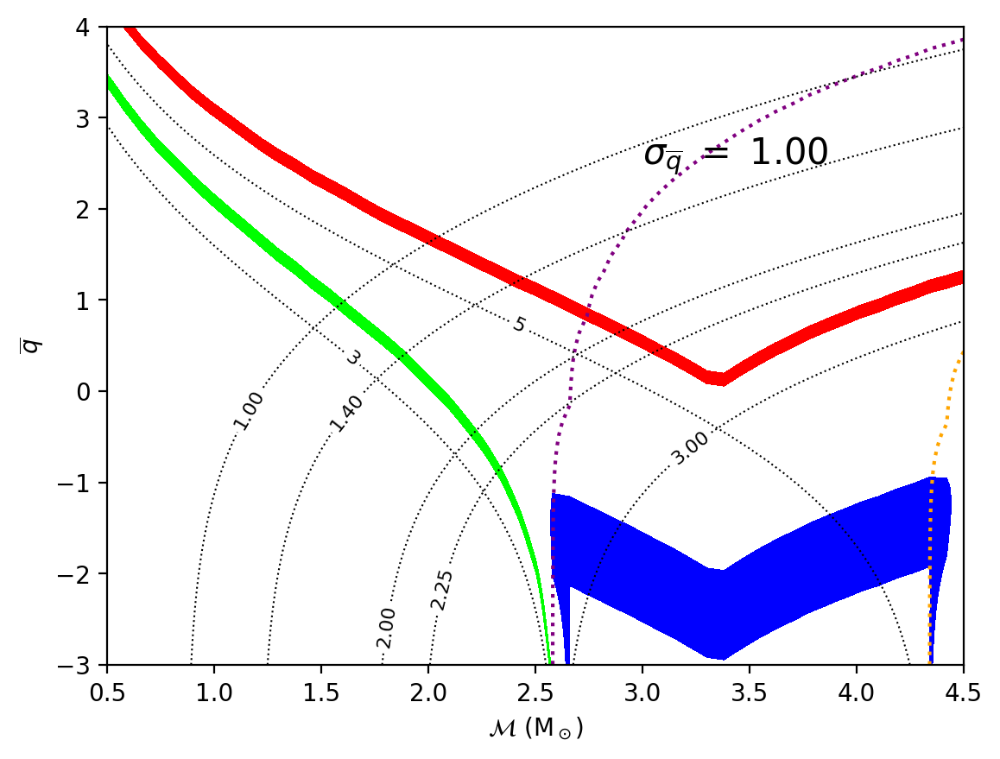

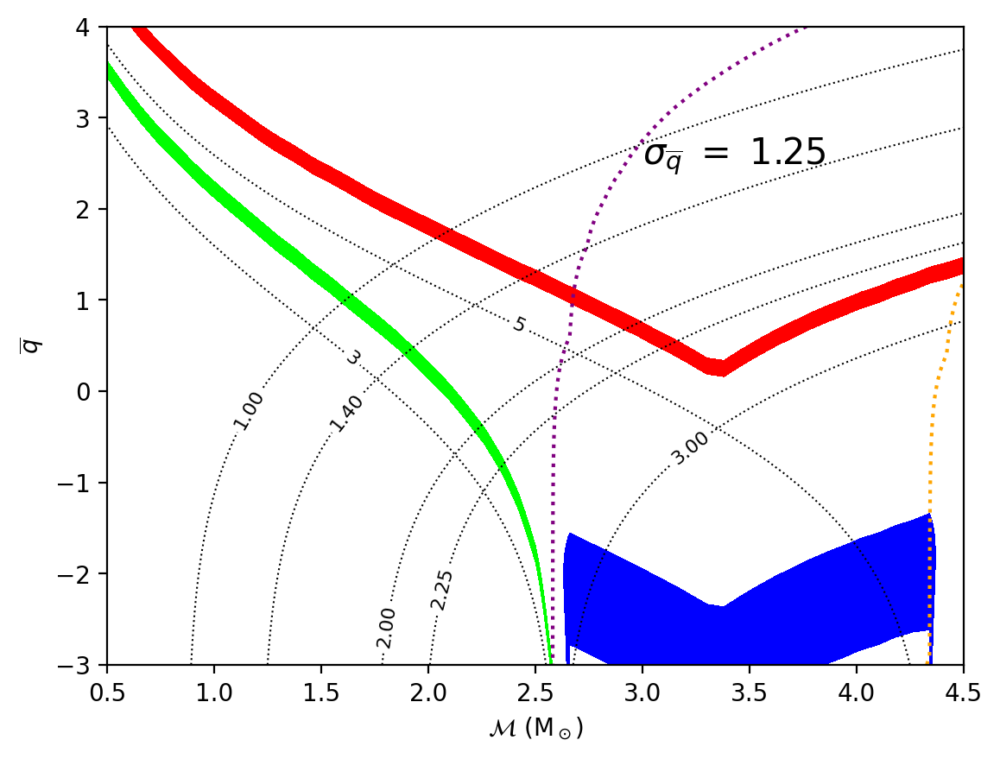

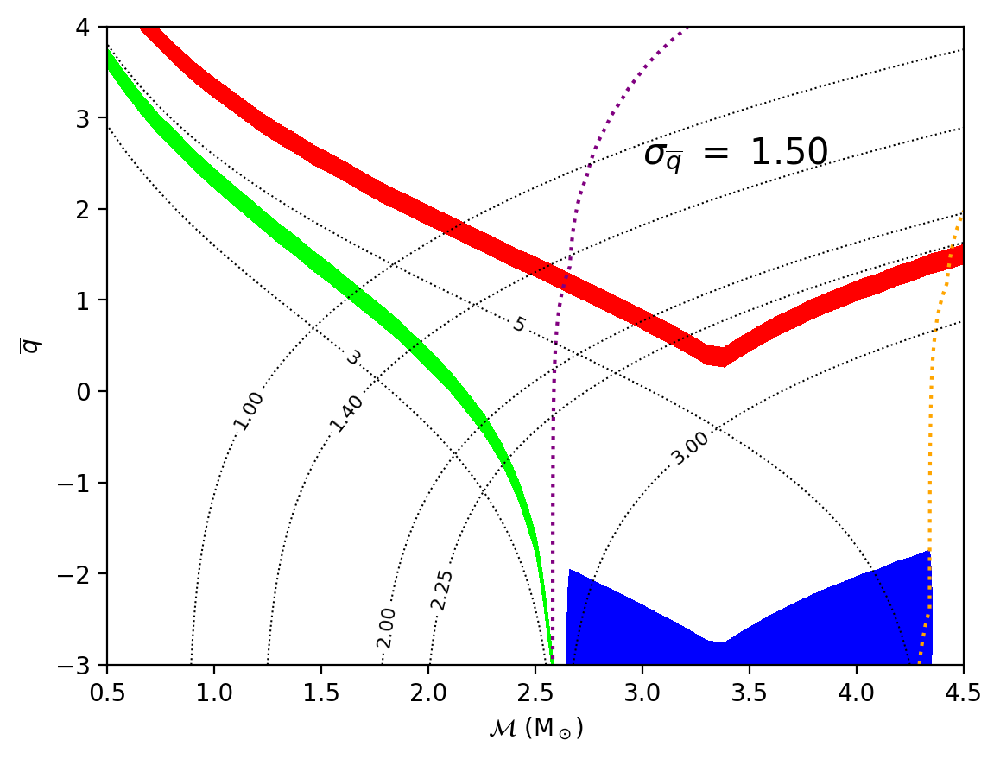

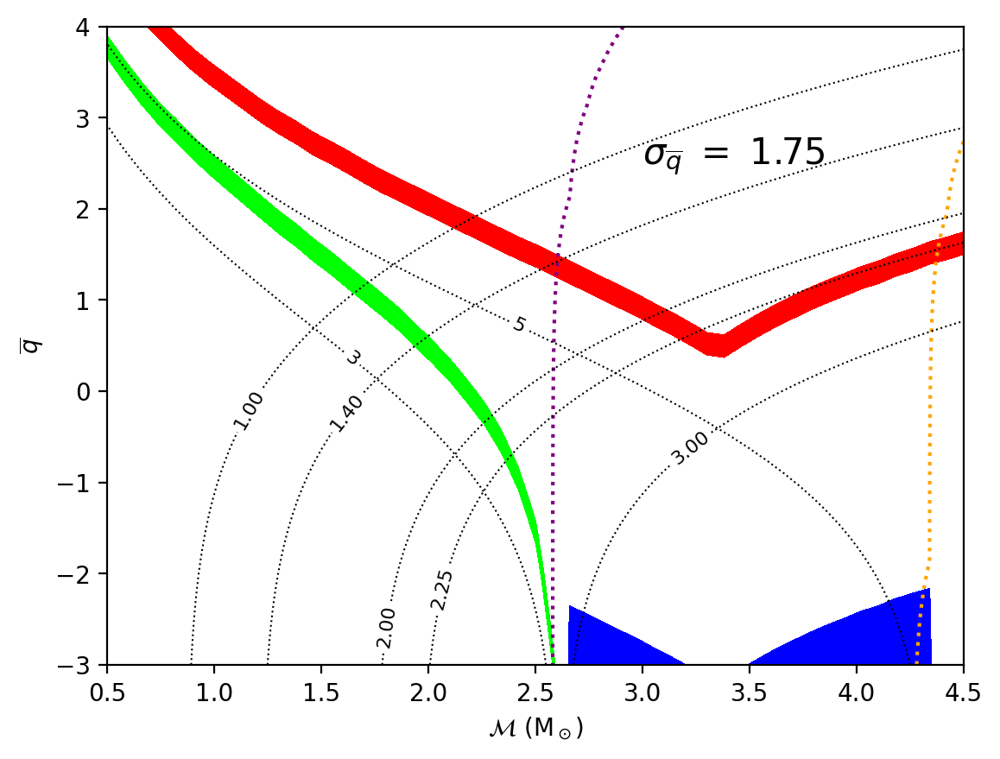

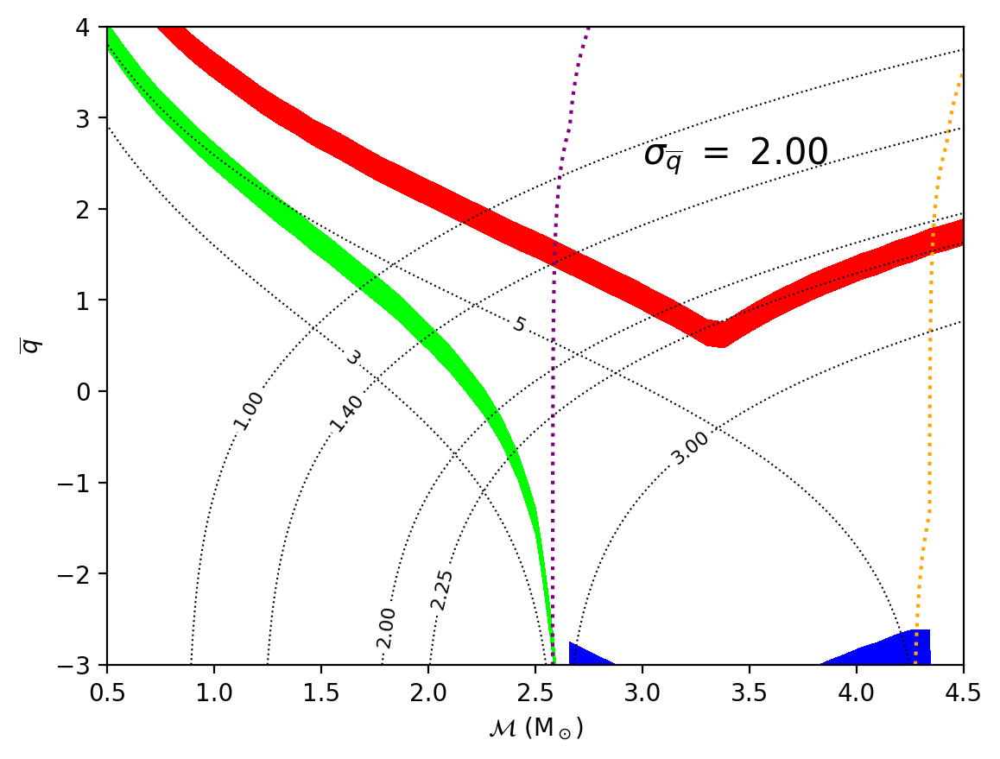

...

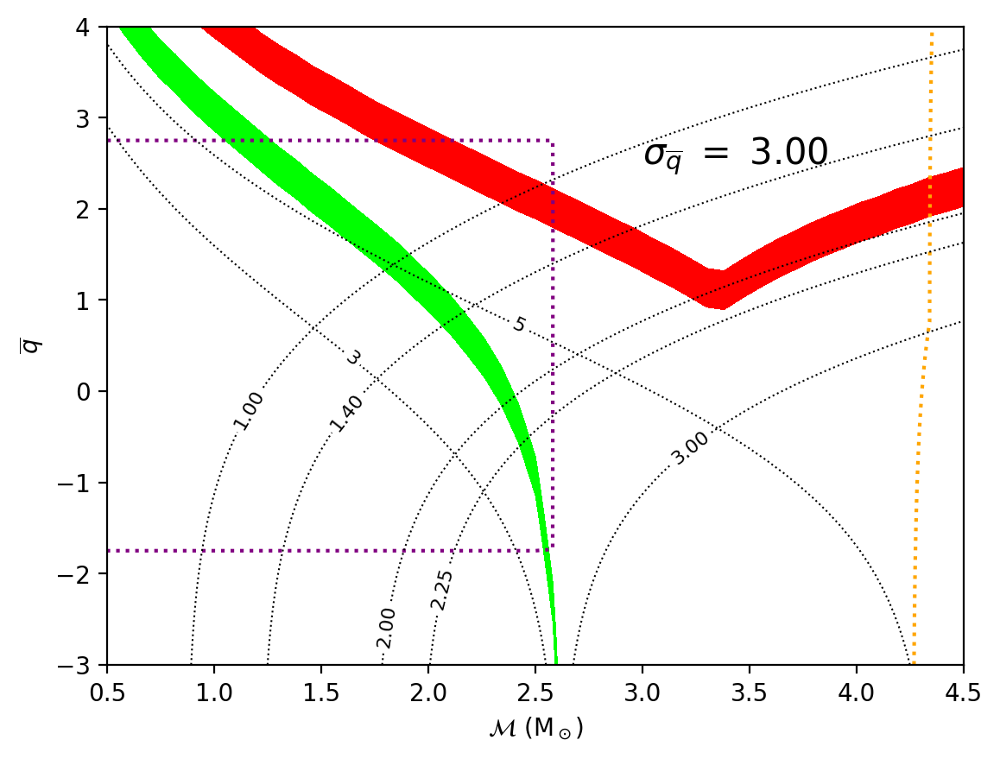

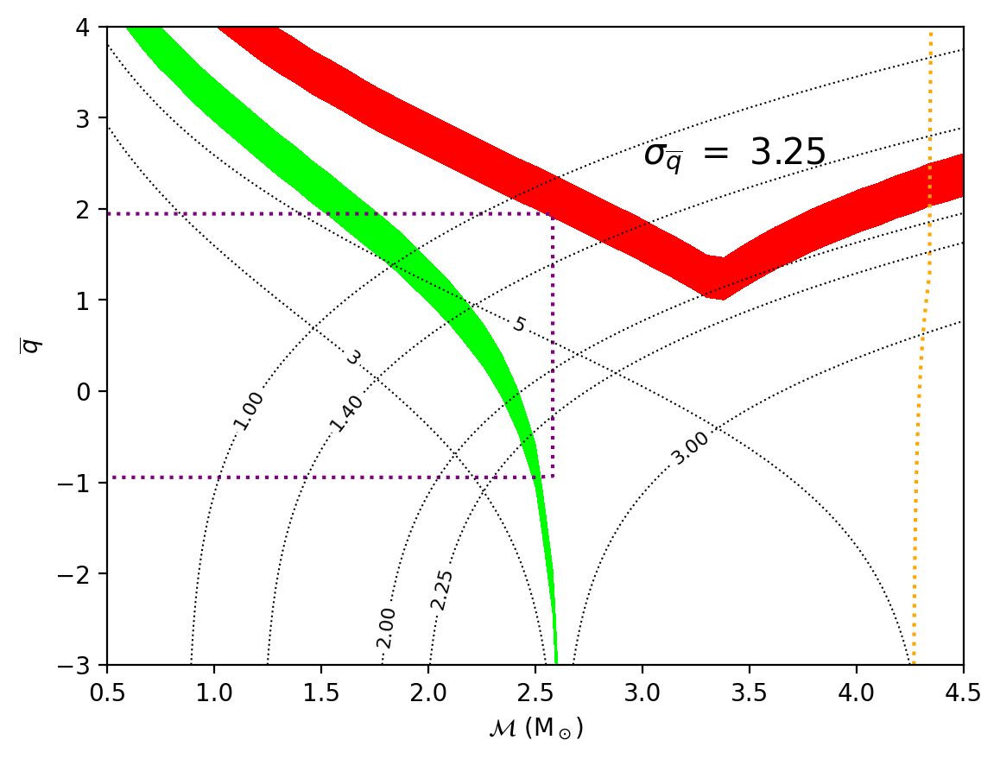

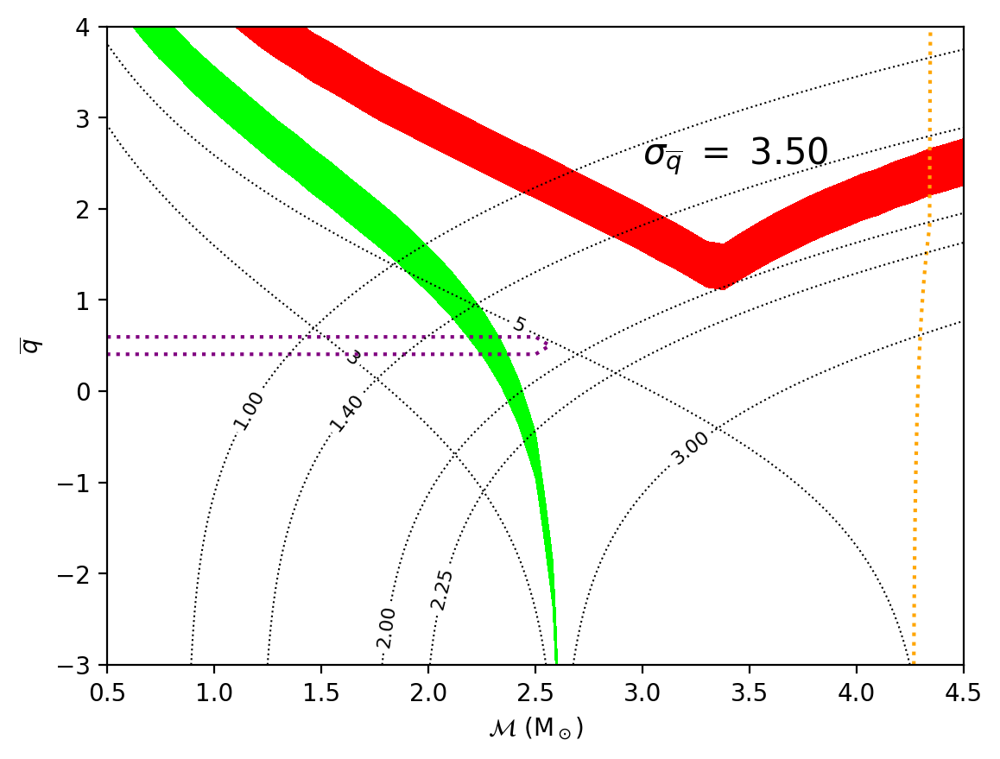

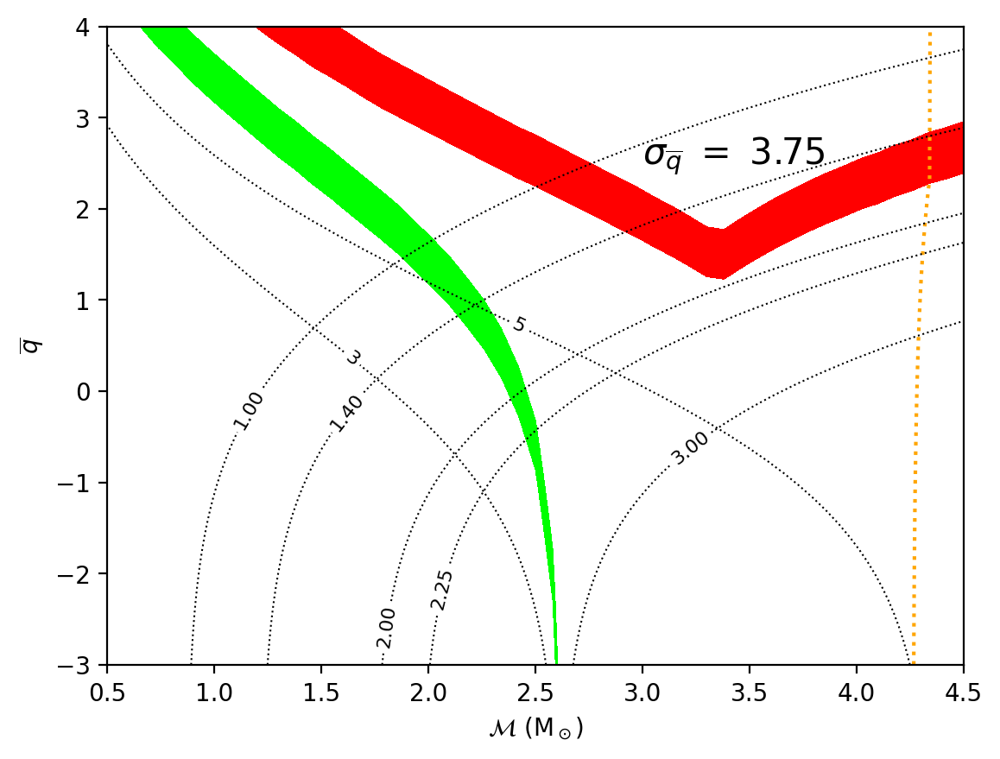

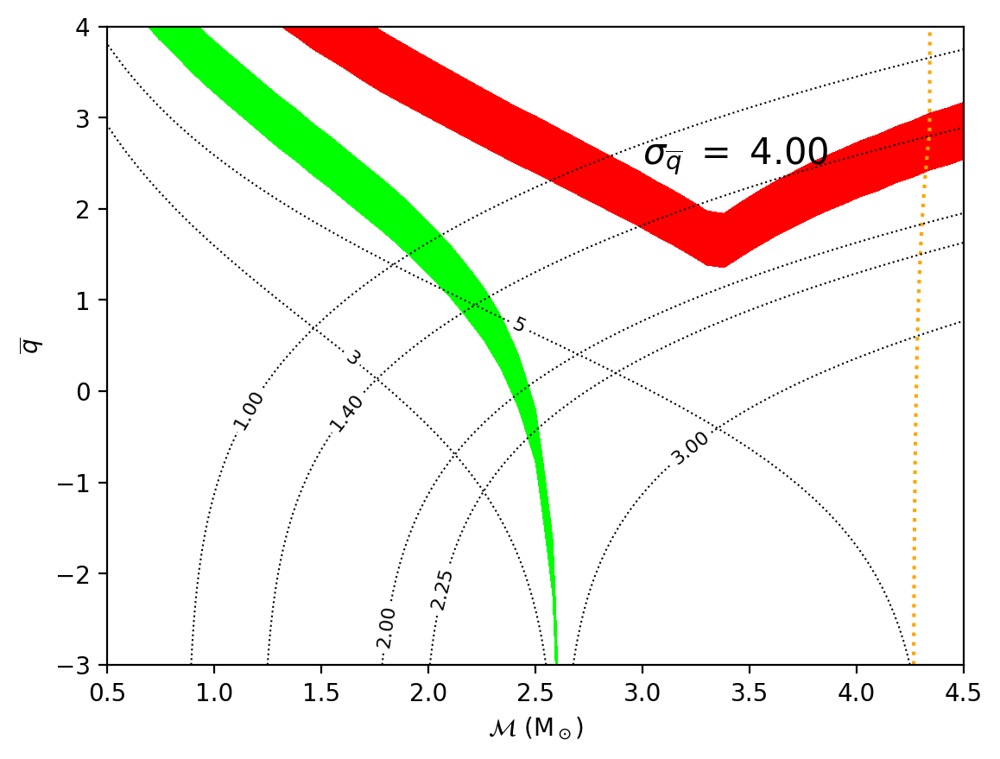

In [7]:
# MERGER PROBABILITY CONTOUR PLOT IN MCH-Q SPACE
# INTERSECTION OF THREE CONTOURS (S230528a)

# method to create polygons of contours to calculate intersection of bands
def to_multipolygon(contour):
  if (contour is not None):
    polygons = list()
    for item in contour.collections:
      for i in item.get_paths():
        v = i.vertices
        x = v[:,0]
        y = v[:,1]
        polygons.append(Polygon([(i[0], i[1]) for i in zip(x,y)]))
    multipoly = so.unary_union(polygons)
    return multipoly

# loading chirp mass (e_mch) and mass ratio error (e_q) data
e_q_arr = original_df['e_q'].drop_duplicates().to_numpy()
e_mch = 0.05

# lists for figures and data
figs = []
mch_list, mch_max_list, mch_min_list = [], [], []
q_bar_list, q_bar_max_list, q_bar_min_list = [], [], []
e_q_intersection_list = []
intersection_list = []

# looping to create all plots for each e_q data
for e_q in e_q_arr:
  # loading data for the axes (chirp mass and q_bar)
  df = original_df.loc[original_df['e_q'] == e_q]
  mch_0 = df["mch_0"].drop_duplicates().to_numpy()
  q_0 = df["q_0"].drop_duplicates().to_numpy()

  # calculates m1 and m2 in terms of the axes
  n = int(math.sqrt(len(df)))
  m1 = np.empty([n,n])
  m2 = np.empty([n,n])
  q = np.array([math.exp(i)+1 for i in q_0])
  for i in range(n):
    for j in range(n):
      m1[i][j]=mch_0[j]*((1+q[i])**0.2)*(q[i]**0.4)
      m2[i][j]=m1[i][j]/q[i]

  # plot properties
  fig, ax = plt.subplots()
  fig.dpi = 200
  plt.ylabel(r"$\overline{q}$")
  plt.xlabel(r"$\mathcal{M}$ (M$_\odot$)")
  ax.set_xlim([0.5,4.5])
  ax.set_ylim([-3,4])

  # draws contours of m1 and m2
  mass1_contour = ax.contour(mch_0,q_0,m1,[3,5],linestyles='dotted',colors='black',linewidths=0.75,zorder=20)
  mass2_contour = ax.contour(mch_0,q_0,m2,[1,1.4,2,2.25,3],linestyles='dotted',colors='black',linewidths=0.75,zorder=20)
  mass1_contour.clabel(mass1_contour.levels,inline=True,fontsize=8)
  mass2_contour.clabel(mass2_contour.levels,inline=True,fontsize=8)

  # changing merger probability data format for contour
  p_bns = np.empty([n,n])
  p_bhns = np.empty([n,n])
  p_gap = np.empty([n,n])
  p_bbh = np.empty([n,n])
  p_ns = np.empty([n,n])
  for i in range(n):
      p_bns[:][i] = df['p_bns'].loc[df['q_0'] == q_0[i]]
      p_bhns[:][i] = df['p_bhns'].loc[df['q_0'] == q_0[i]]
      p_gap[:][i] = df['p_gap'].loc[df['q_0'] == q_0[i]]
      p_bbh[:][i] = df['p_bbh'].loc[df['q_0'] == q_0[i]]
      p_ns[:][i] = df['p_ns'].loc[df['q_0'] == q_0[i]]

  # creates bands for each merger probability
  prob_bands = [
      (p_bns, candidate_p_bns, 'lime'),
      (p_bhns, candidate_p_bhns, 'red'),
      (p_gap, candidate_p_gap, 'blue'),
      (p_bbh, candidate_p_bbh, 'orange'),
      (p_ns, candidate_p_ns, 'purple')
    ]

  erase_area = []
  if (mass_outer_limit>0): erase_area.append(ax.contourf(mch_0, q_0, m2, [0.0,mass_outer_limit], alpha=0))
  erase_area.append(ax.contourf(mch_0, q_0, m2, [ns_mass_limit,5], alpha=0))
  erase_area.append(ax.contourf(mch_0, q_0, p_ns, [0.999,1.0], alpha=0)) # for constraints 8

  polygons = []
  for p_values, candidate_prob, color in prob_bands:
    if candidate_prob < 0.025:
      if candidate_prob == 0: candidate_prob = 0.001
      contour = ax.contour(mch_0, q_0, p_values, [candidate_prob], colors=color, linestyles='dotted')
    elif candidate_prob == 1:
      candidate_prob = 0.999
      contour = ax.contour(mch_0, q_0, p_values, [candidate_prob], colors=color, linestyles='dotted')
    else:
      contour = ax.contourf(mch_0, q_0, p_values, [candidate_prob - 0.025, candidate_prob + 0.025], colors=color)
      polygons.append(to_multipolygon(contour))
      intersection_length = len(polygons)

  # calculating intersection
  for i in range(intersection_length):
    for j in range(i+1,intersection_length):
      for k in range(j+1,intersection_length):
        p1 = polygons[i]
        p2 = polygons[j]
        p3 = polygons[k]
        if (p1 is not None and p2 is not None and p3 is not None):
          contour_intersect = shapely.intersection(p1,p2)

          if not contour_intersect.is_empty: contour_intersect = shapely.intersection(contour_intersect,p3)
          else: continue

          for area in erase_area:
            if not contour_intersect.is_empty: contour_intersect = contour_intersect.difference(to_multipolygon(area))
            else: break

          if not contour_intersect.is_empty:
            if (contour_intersect.geom_type == "MultiPolygon"):
              contour_intersect = shapely.concave_hull(contour_intersect)
            plt.fill_between(*contour_intersect.exterior.xy,hatch="/////")
            plt.plot(*contour_intersect.exterior.xy,color="black",linewidth=1)
            centroid = contour_intersect.centroid
            ellipse = mpl.patches.Ellipse([centroid.x,centroid.y], width=2*e_mch, height=2*e_q,linewidth=0.75,linestyle='dashed',facecolor='none',edgecolor='black',zorder=20)
            ax.add_patch(ellipse)

            bounds = contour_intersect.bounds
            mch_list.append(centroid.x)
            mch_min_list.append(bounds[0])
            mch_max_list.append(bounds[2])
            q_bar_list.append(centroid.y)
            q_bar_min_list.append(bounds[1])
            q_bar_max_list.append(bounds[3])
            e_q_intersection_list.append(e_q)
            intersection_list.append(contour_intersect)

  # appends figure to list of figures
  ax.text(3.0,2.5,r"$\sigma_{\overline{q}}$ $=$ " + str('{:.2f}'.format(e_q)),fontsize=15) # label for error in q
  figs.append(fig)

# saves figures in one pdf file
p = PdfPages(url[-16:-4] + "_" + signal_name+ "_ver20230724" + ".pdf")
for fig in figs:
    fig.savefig(p, format='pdf')

# MASSES VS E_Q PLOT

estimation_length = len(e_q_intersection_list)
if (estimation_length > 0):
  # processing data from previous figures to mass ratio, m1, and m2
  fig, ax = plt.subplots()
  # processing q values and their errors
  q_list = [math.exp(q_bar_list[i])+1 for i in range(estimation_length)]
  q_max_list = [math.exp(q_bar_max_list[i])+1 for i in range(estimation_length)]
  q_min_list = [math.exp(q_bar_min_list[i])+1 for i in range(estimation_length)]
  # processing m1 values and their errors
  m1_list = [mch_list[i]*((1+q_list[i])**0.2)*(q_list[i]**0.4) for i in range(estimation_length)]
  m1_max_list = [mch_max_list[i]*((1+q_max_list[i])**0.2)*(q_max_list[i]**0.4) for i in range(estimation_length)]
  m1_min_list = [mch_min_list[i]*((1+q_min_list[i])**0.2)*(q_min_list[i]**0.4) for i in range(estimation_length)]
  # processing m2 values and their errors
  m2_list = [m1_list[i]/q_list[i] for i in range(estimation_length)]
  m2_max_list = [mch_max_list[i]*((1+q_min_list[i])**0.2)*(q_min_list[i]**-0.6) for i in range(estimation_length)]
  m2_min_list = [mch_min_list[i]*((1+q_max_list[i])**0.2)*(q_max_list[i]**-0.6) for i in range(estimation_length)]

  # plotting all values of interest (chirp mass, m1, and m2) and regions representing their error
  # plotting chirp mass
  plt.scatter(e_q_intersection_list,mch_list,color="black",s=5)
  plt.errorbar(e_q_intersection_list,mch_list,yerr=[[mch_list[0]-mch_min_list[0]],[mch_max_list[0]-mch_list[0]]],color="black",alpha=0.5)
  plt.text(e_q_intersection_list[estimation_length-2]+0.002,2.3,r"$\mathcal{M}$",fontsize=12,color="black")
  # plotting m1
  plt.scatter(e_q_intersection_list,m1_list,color="blue",s=5)
  plt.errorbar(e_q_intersection_list,m1_list,yerr=[[m1_list[0]-m1_min_list[0]],[m1_max_list[0]-m1_list[0]]],color="blue",alpha=0.5)
  plt.text(e_q_intersection_list[estimation_length-2]+0.002,3.2,r"$M_1$",fontsize=12,color="blue")
  # plotting m2
  plt.scatter(e_q_intersection_list,m2_list,color="green",s=5)
  plt.errorbar(e_q_intersection_list,m2_list,yerr=[[m2_list[0]-m2_min_list[0]],[m2_max_list[0]-m2_list[0]]],color="green",alpha=0.5)
  plt.text(e_q_intersection_list[estimation_length-2]+0.002,2.2,r"$M_2$",fontsize=12,color="green")

  # plot properties and saving in PDF containing all figures of the event
  plt.ylabel(r"$\mathcal{M}/M_\odot$, $M_1/M_\odot$, $M_2/M_\odot$")
  plt.xlabel(r"$\sigma_{\overline{q}}$")
  fig.savefig(p, format='pdf')
p.close()

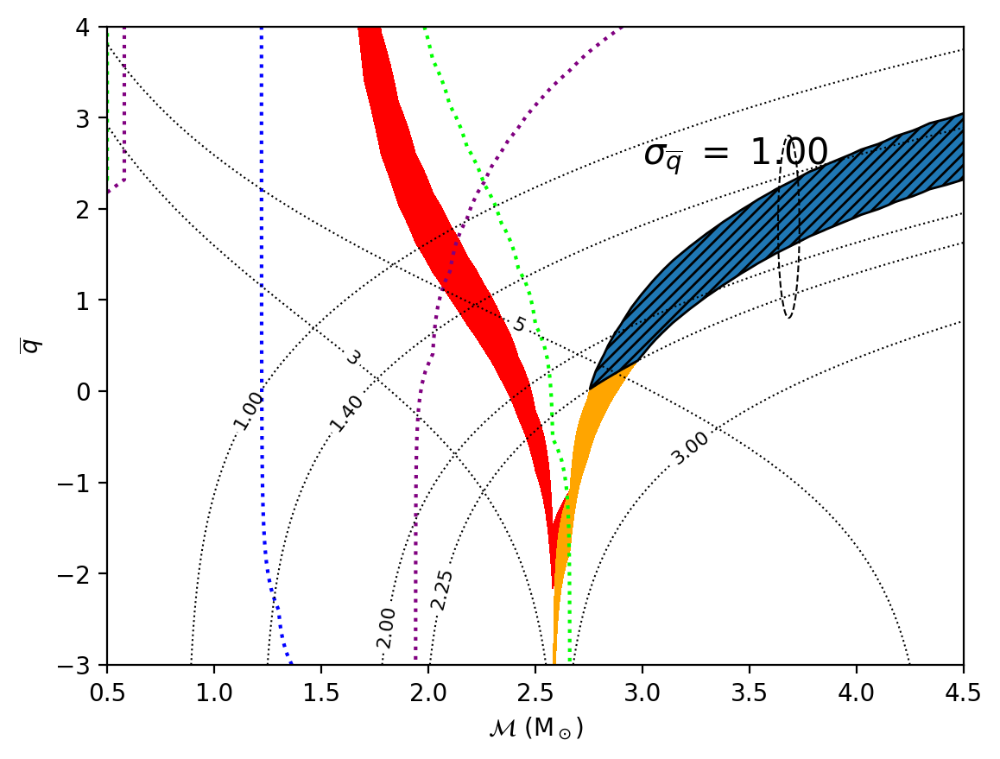

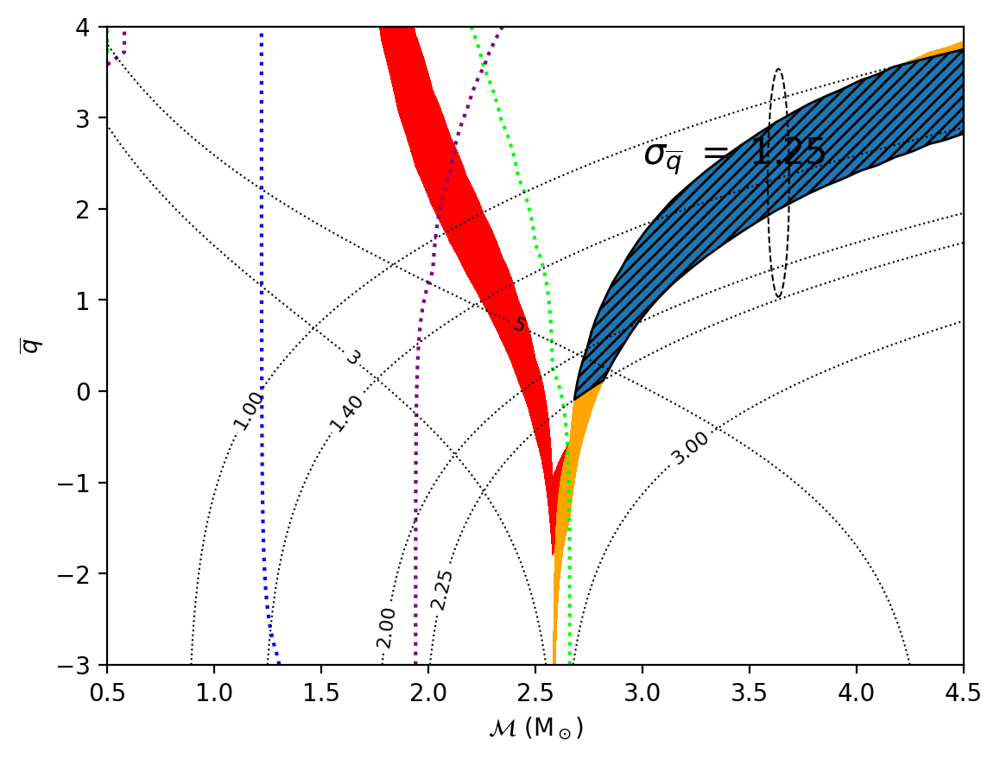

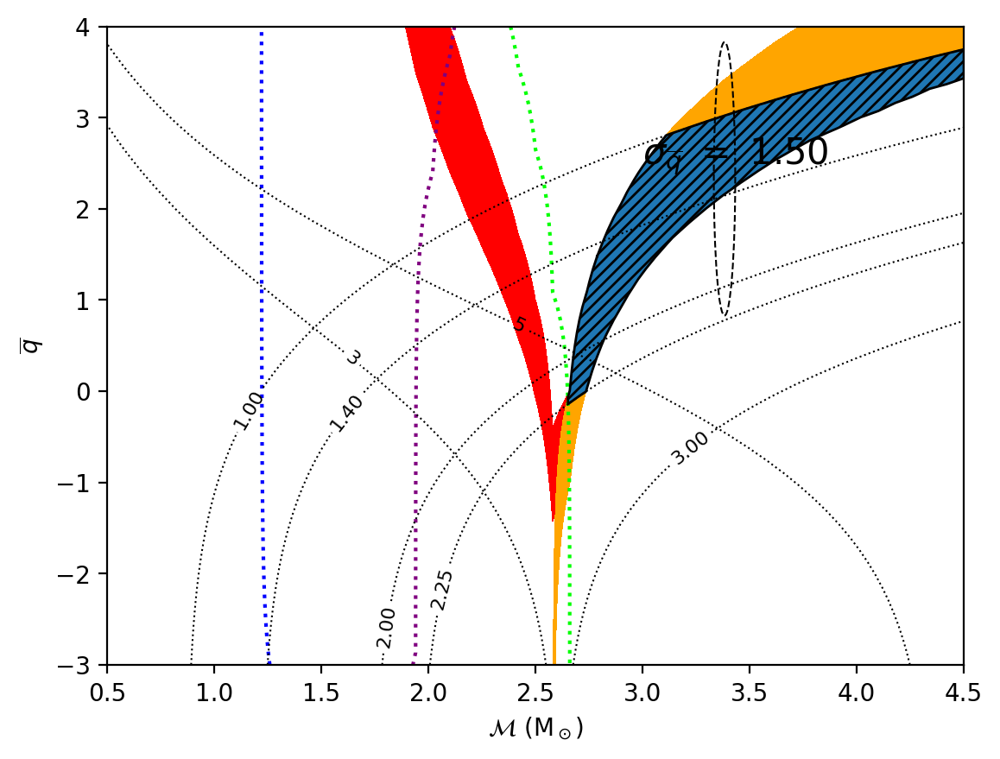

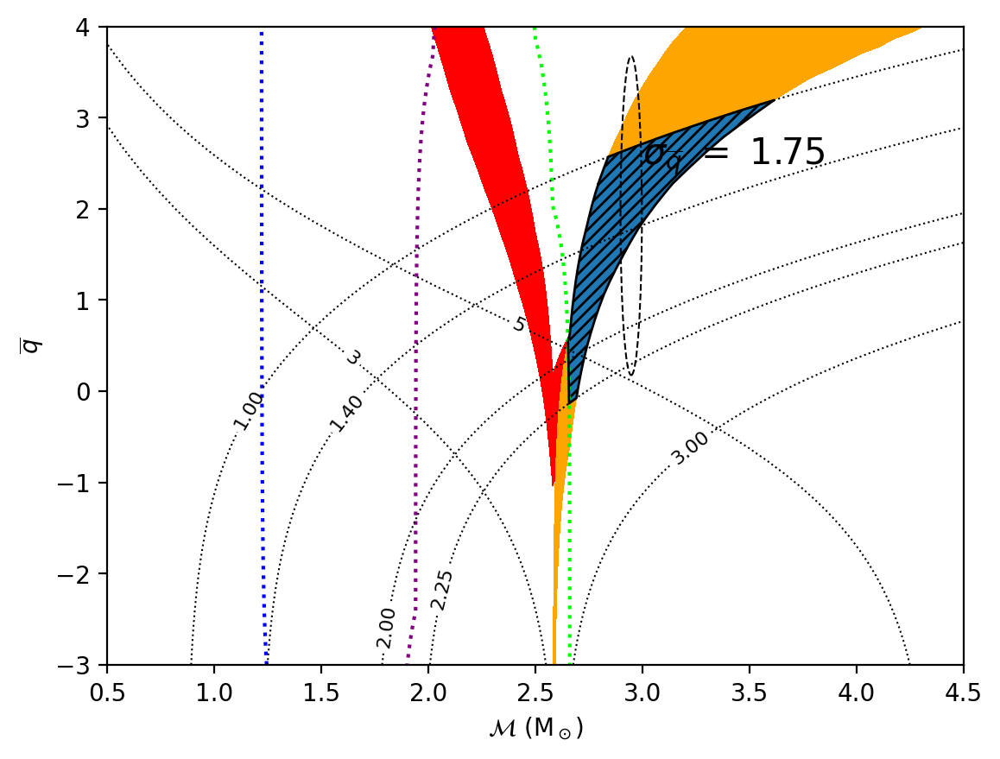

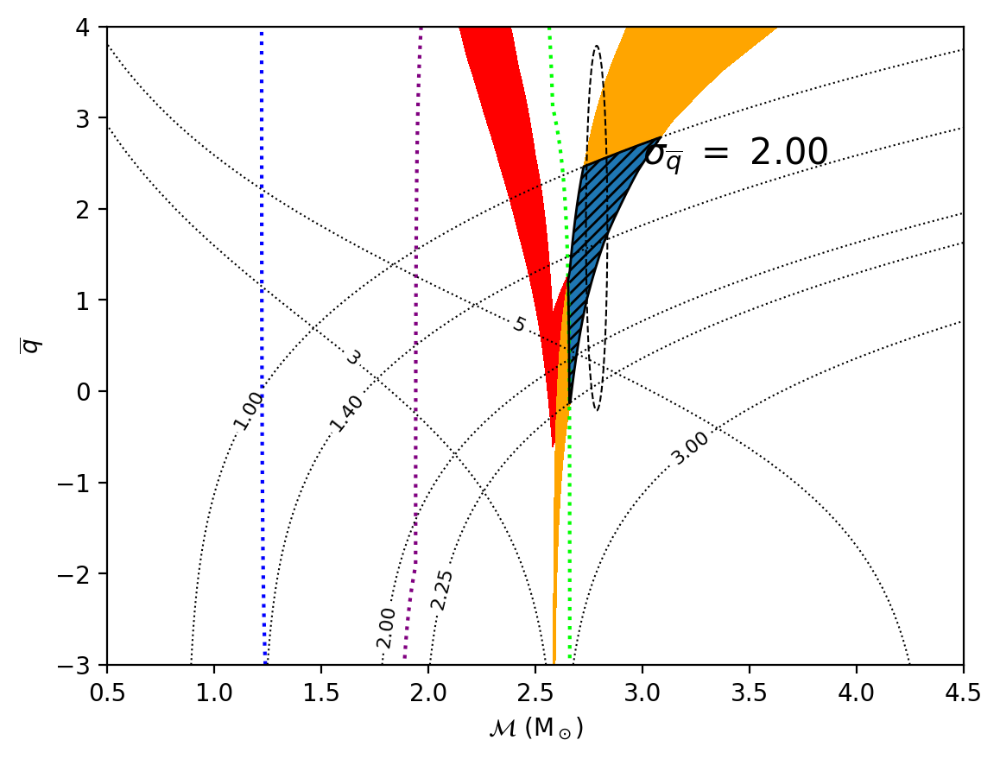

...

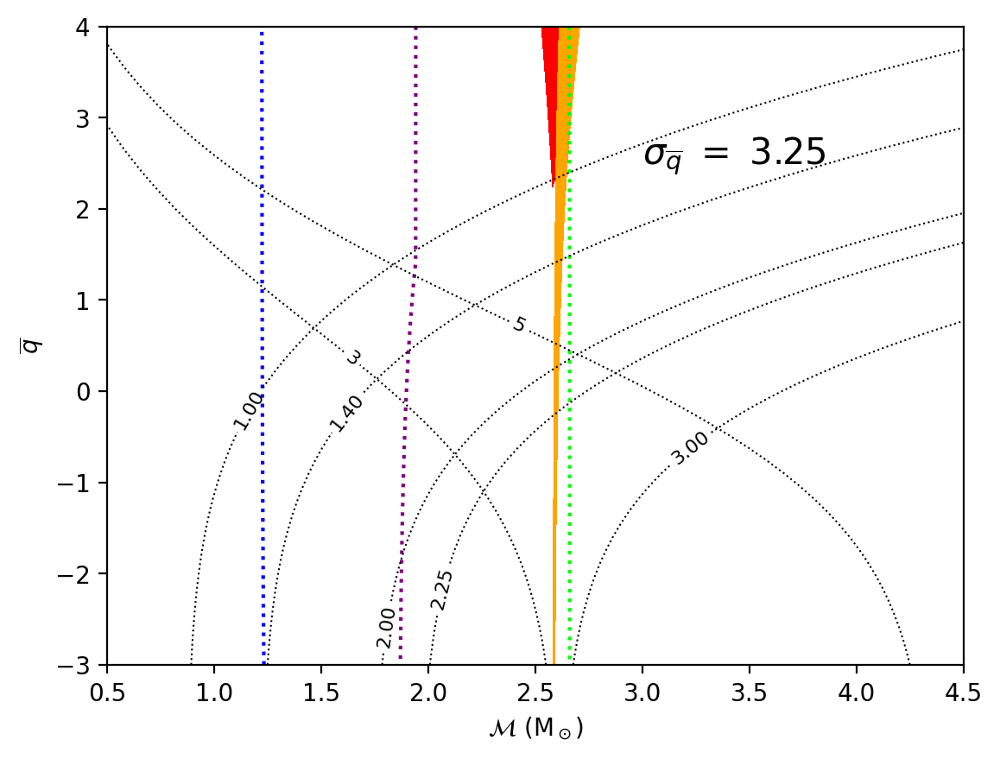

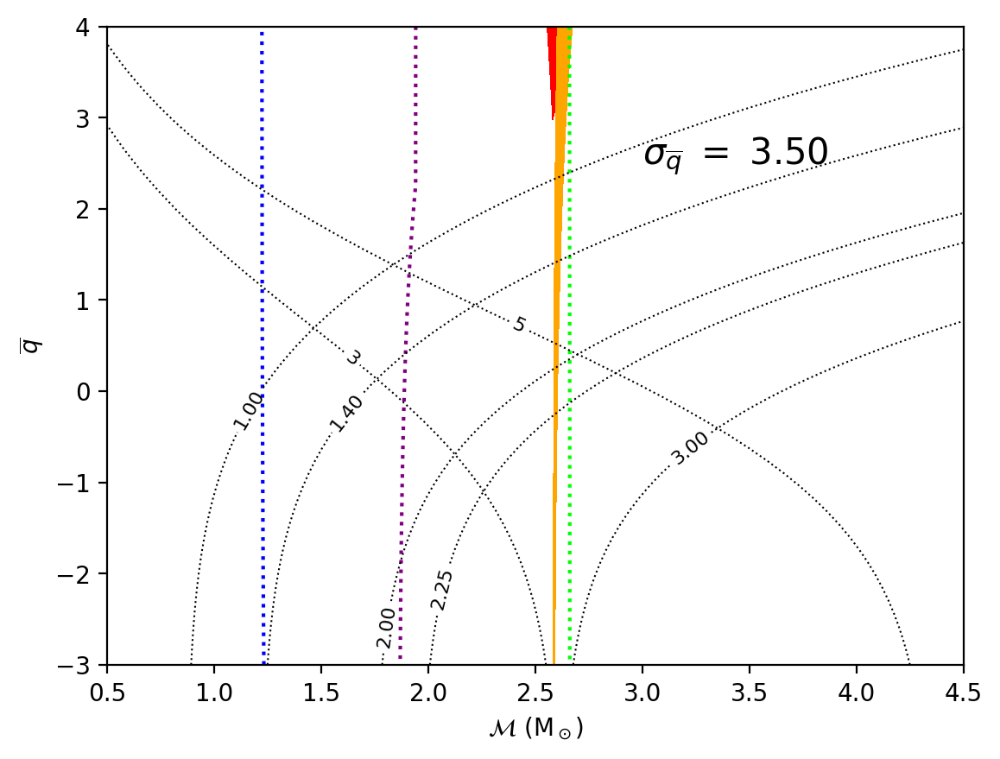

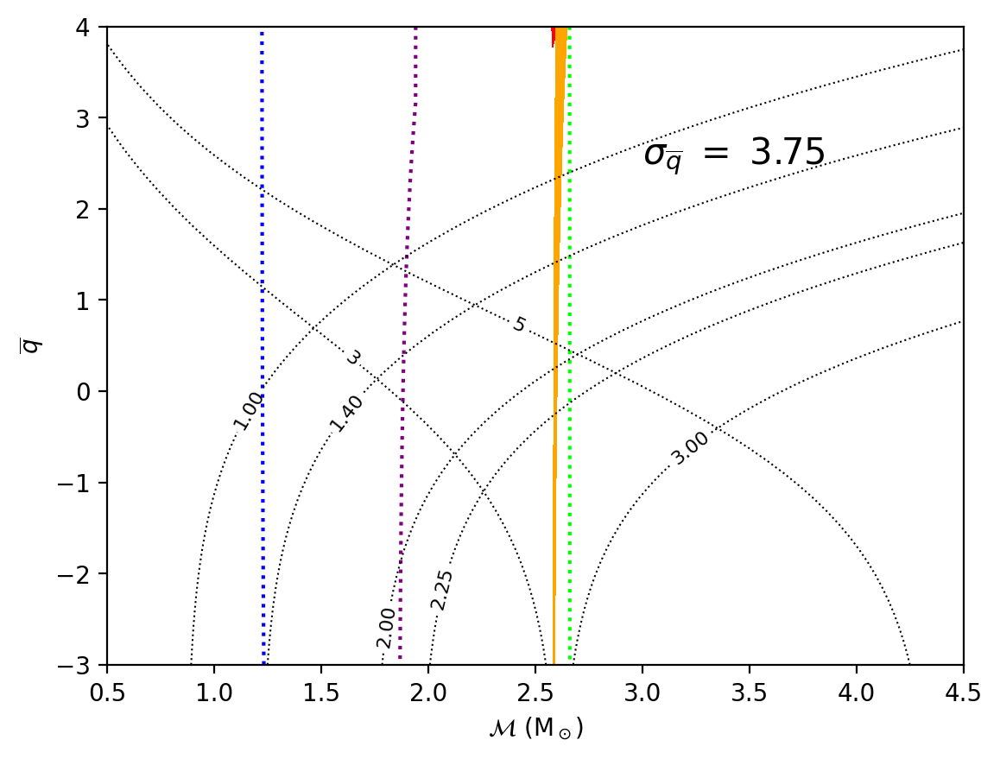

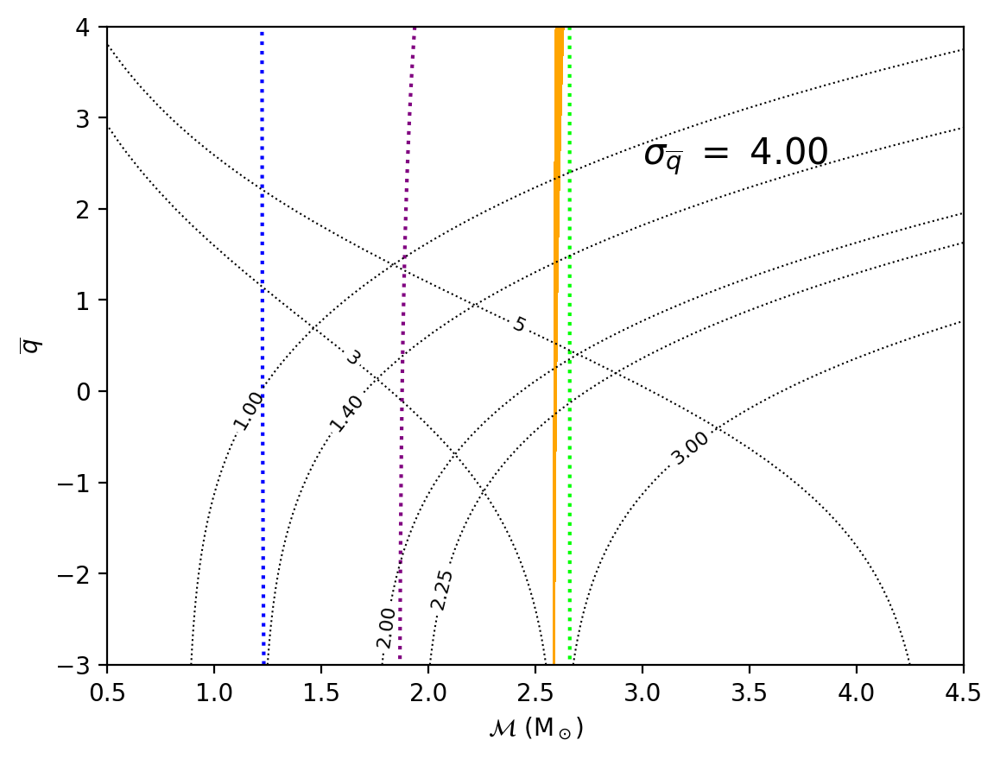

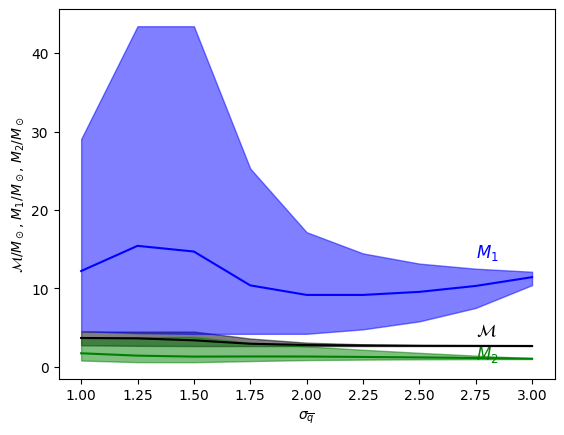

In [ ]:
# MERGER PROBABILITY CONTOUR PLOT IN MCH-Q SPACE
# INTERSECTION OF TWO CONTOURS (S230518h)

# method to create polygons of contours to calculate intersection of bands
def to_multipolygon(contour):
  if (contour is not None):
    polygons = [Polygon(item.get_paths()[0].vertices) for item in contour.collections if len(item.get_paths()) > 0]
    multipoly = so.unary_union(polygons)
    return multipoly

# loading chirp mass (e_mch) and mass ratio error (e_q) data
e_q_arr = original_df['e_q'].drop_duplicates().to_numpy()

e_mch = 0.05
# lists for figures and data
figs = []
mch_list, mch_max_list, mch_min_list = [], [], []
q_bar_list, q_bar_max_list, q_bar_min_list = [], [], []
e_q_intersection_list = []
intersection_list = []

# looping to create all plots for each e_q data
for e_q in e_q_arr:
  # loading data for the axes (chirp mass and q_bar)
  df = original_df.loc[original_df['e_q'] == e_q]
  mch_0 = df["mch_0"].drop_duplicates().to_numpy()
  q_0 = df["q_0"].drop_duplicates().to_numpy()

  # calculates m1 and m2 in terms of the axes
  n = int(math.sqrt(len(df)))
  m1 = np.empty([n,n])
  m2 = np.empty([n,n])
  q = np.array([math.exp(i)+1 for i in q_0])
  for i in range(n):
    for j in range(n):
      m1[i][j]=mch_0[j]*((1+q[i])**0.2)*(q[i]**0.4)
      m2[i][j]=m1[i][j]/q[i]

  # plot properties
  fig, ax = plt.subplots()
  fig.dpi = 200
  plt.ylabel(r"$\overline{q}$")
  plt.xlabel(r"$\mathcal{M}$ (M$_\odot$)")
  ax.set_xlim([0.5,4.5])
  ax.set_ylim([-3,4])

  # draws contours of m1 and m2
  mass1_contour = ax.contour(mch_0,q_0,m1,[3,5],linestyles='dotted',colors='black',linewidths=0.75,zorder=20)
  mass2_contour = ax.contour(mch_0,q_0,m2,[1,1.4,2,2.25,3],linestyles='dotted',colors='black',linewidths=0.75,zorder=20)
  mass1_contour.clabel(mass1_contour.levels,inline=True,fontsize=8)
  mass2_contour.clabel(mass2_contour.levels,inline=True,fontsize=8)

  # changing merger probability data format for contour
  p_bns = np.empty([n,n])
  p_bhns = np.empty([n,n])
  p_gap = np.empty([n,n])
  p_bbh = np.empty([n,n])
  p_ns = np.empty([n,n])
  for i in range(n):
      p_bns[:][i] = df['p_bns'].loc[df['q_0'] == q_0[i]]
      p_bhns[:][i] = df['p_bhns'].loc[df['q_0'] == q_0[i]]
      p_gap[:][i] = df['p_gap'].loc[df['q_0'] == q_0[i]]
      p_bbh[:][i] = df['p_bbh'].loc[df['q_0'] == q_0[i]]
      p_ns[:][i] = df['p_ns'].loc[df['q_0'] == q_0[i]]

  # creates bands for each merger probability
  prob_bands = [
      (p_bns, candidate_p_bns, 'lime'),
      (p_bhns, candidate_p_bhns, 'red'),
      (p_gap, candidate_p_gap, 'blue'),
      (p_bbh, candidate_p_bbh, 'orange'),
      (p_ns, candidate_p_ns, 'purple'),
    ]

  erase_area = []
  if mass_outer_limit > 0: erase_area.append(ax.contourf(mch_0, q_0, m2, [0,mass_outer_limit], alpha=0))
  erase_area.append(ax.contourf(mch_0, q_0, m2, [ns_mass_limit,5], alpha=0))
  erase_area.append(ax.contourf(mch_0, q_0, p_bns, [0.001,1.0], alpha=0))

  polygons = []
  for p_values, candidate_prob, color in prob_bands:
    if candidate_prob < 0.025:
      if candidate_prob == 0: candidate_prob = 0.001
      contour = ax.contour(mch_0, q_0, p_values, [candidate_prob], colors=color, linestyles='dotted')
    elif candidate_prob == 1:
      candidate_prob = 0.999
      contour = ax.contour(mch_0, q_0, p_values, [candidate_prob], colors=color, linestyles='dotted')
    else:
      contour = ax.contourf(mch_0, q_0, p_values, [candidate_prob - 0.025, candidate_prob + 0.025], colors=color)
      # determines and plots all the intersections and stores data in lists
      polygons.append(to_multipolygon(contour))
      intersection_length = len(polygons)

  for i in range(intersection_length):
    for j in range(i+1,intersection_length):
      p1 = polygons[i]
      p2 = polygons[j]
      if (p1 is not None and p2 is not None):
        contour_intersect = shapely.intersection(p1,p2)

        for area in erase_area:
          if not contour_intersect.is_empty: contour_intersect = contour_intersect.difference(to_multipolygon(area))
          else: break

        if not contour_intersect.is_empty:
          # contour_intersect = shapely.convex_hull(contour_intersect)
          plt.fill_between(*contour_intersect.exterior.xy,hatch="/////")
          plt.plot(*contour_intersect.exterior.xy,color="black",linewidth=1)
          centroid = contour_intersect.centroid
          ellipse = mpl.patches.Ellipse([centroid.x,centroid.y], width=2*e_mch, height=2*e_q,linewidth=0.75,linestyle='dashed',facecolor='none',edgecolor='black',zorder=20)
          ax.add_patch(ellipse)

          bounds = contour_intersect.bounds
          mch_list.append(centroid.x)
          mch_min_list.append(bounds[0])
          mch_max_list.append(bounds[2])
          q_bar_list.append(centroid.y)
          q_bar_min_list.append(bounds[1])
          q_bar_max_list.append(bounds[3])
          e_q_intersection_list.append(e_q)
          intersection_list.append(contour_intersect)

  # appends figure to list of figures
  ax.text(3.0,2.5,r"$\sigma_{\overline{q}}$ $=$ " + str('{:.2f}'.format(e_q)),fontsize=15) # label for error in q
  figs.append(fig)

# saves figures in one pdf file
p = PdfPages(url[-16:-4] + "_" + signal_name+ "_ver20230724" + ".pdf")
for fig in figs:
    fig.savefig(p, format='pdf')

# MASSES VS E_Q PLOT

estimation_length = len(e_q_intersection_list)
if (estimation_length > 0):
  # processing data from previous figures to mass ratio, m1, and m2
  fig, ax = plt.subplots()
  # processing q values and their errors
  q_list = [math.exp(q_bar_list[i])+1 for i in range(estimation_length)]
  q_max_list = [math.exp(q_bar_max_list[i])+1 for i in range(estimation_length)]
  q_min_list = [math.exp(q_bar_min_list[i])+1 for i in range(estimation_length)]
  # processing m1 values and their errors
  m1_list = [mch_list[i]*((1+q_list[i])**0.2)*(q_list[i]**0.4) for i in range(estimation_length)]
  m1_max_list = [mch_max_list[i]*((1+q_max_list[i])**0.2)*(q_max_list[i]**0.4) for i in range(estimation_length)]
  m1_min_list = [mch_min_list[i]*((1+q_min_list[i])**0.2)*(q_min_list[i]**0.4) for i in range(estimation_length)]
  # processing m2 values and their errors
  m2_list = [m1_list[i]/q_list[i] for i in range(estimation_length)]
  m2_max_list = [mch_max_list[i]*((1+q_min_list[i])**0.2)*(q_min_list[i]**-0.6) for i in range(estimation_length)]
  m2_min_list = [mch_min_list[i]*((1+q_max_list[i])**0.2)*(q_max_list[i]**-0.6) for i in range(estimation_length)]

  # plotting all values of interest (chirp mass, m1, and m2) and regions representing their error
  # plotting chirp mass
  plt.plot(e_q_intersection_list,mch_list,color="black")
  plt.fill_between(e_q_intersection_list,mch_min_list,mch_max_list,color="black",alpha=0.5)
  plt.text(e_q_intersection_list[estimation_length-2],4,r"$\mathcal{M}$",fontsize=12,color="black")
  # plotting m1
  plt.plot(e_q_intersection_list,m1_list,color="blue")
  plt.fill_between(e_q_intersection_list,m1_min_list,m1_max_list,color="blue",alpha=0.5)
  plt.text(e_q_intersection_list[estimation_length-2],14,r"$M_1$",fontsize=12,color="blue")
  # plotting m2
  plt.plot(e_q_intersection_list,m2_list,color="green")
  plt.fill_between(e_q_intersection_list,m2_min_list,m2_max_list,color="green",alpha=0.5)
  plt.text(e_q_intersection_list[estimation_length-2],1,r"$M_2$",fontsize=12,color="green")

  # plot properties and saving in PDF containing all figures of the event
  plt.ylabel(r"$\mathcal{M}/M_\odot$, $M_1/M_\odot$, $M_2/M_\odot$")
  plt.xlabel(r"$\sigma_{\overline{q}}$")
  fig.savefig(p, format='pdf')
p.close()

/usr/local/lib/python3.10/dist-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)


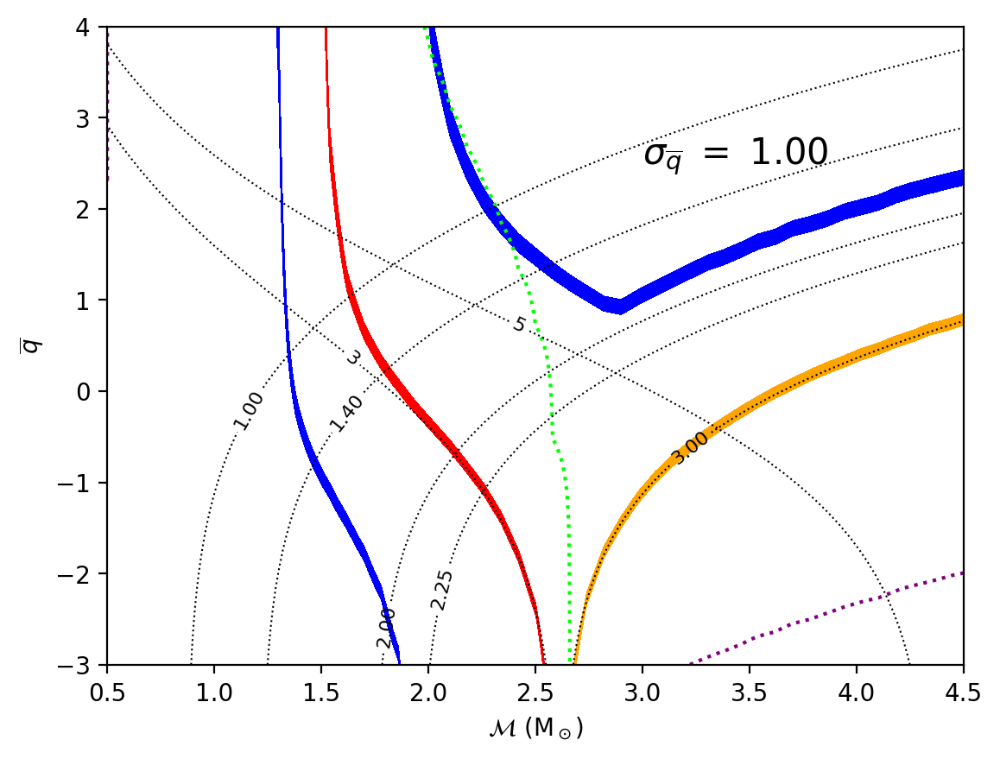

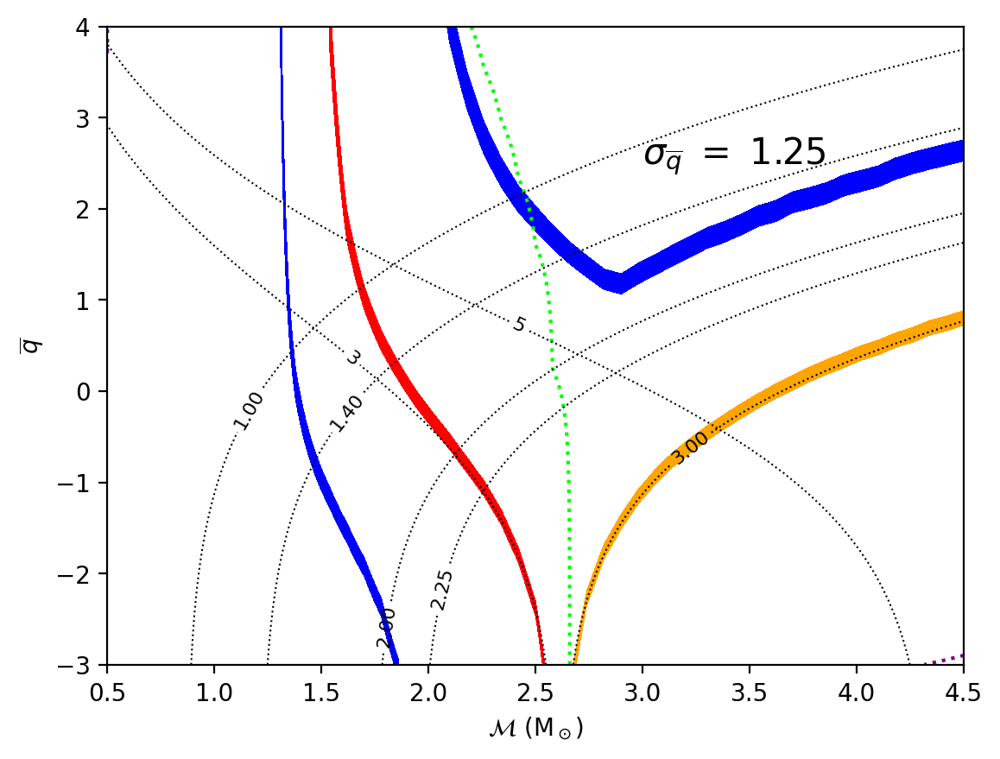

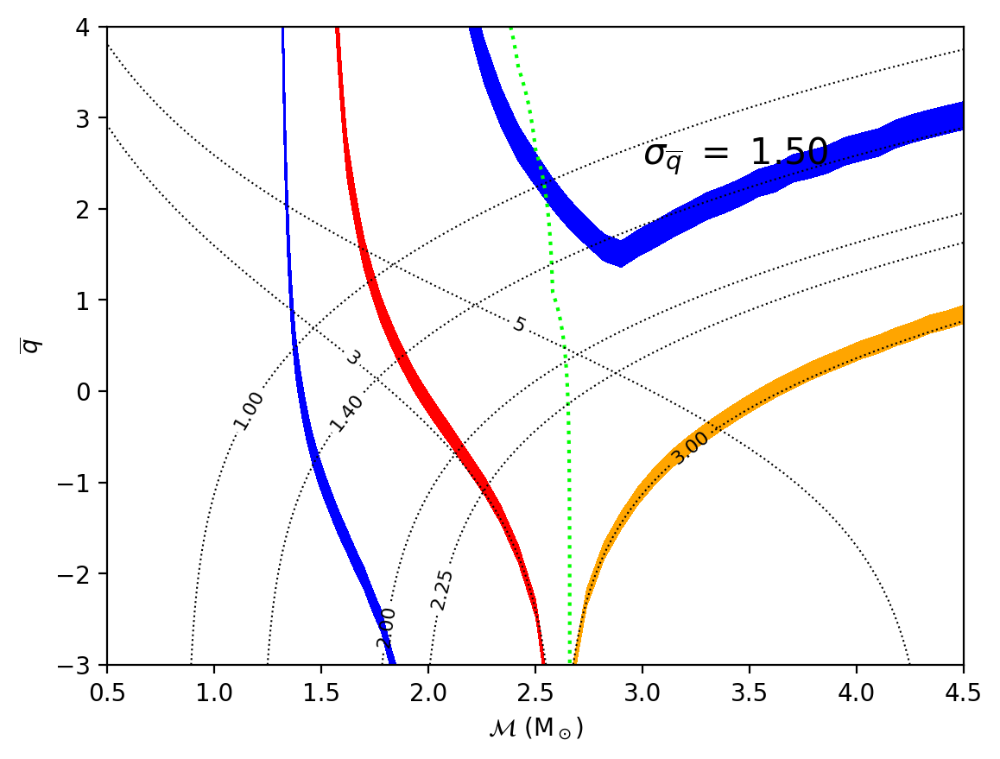

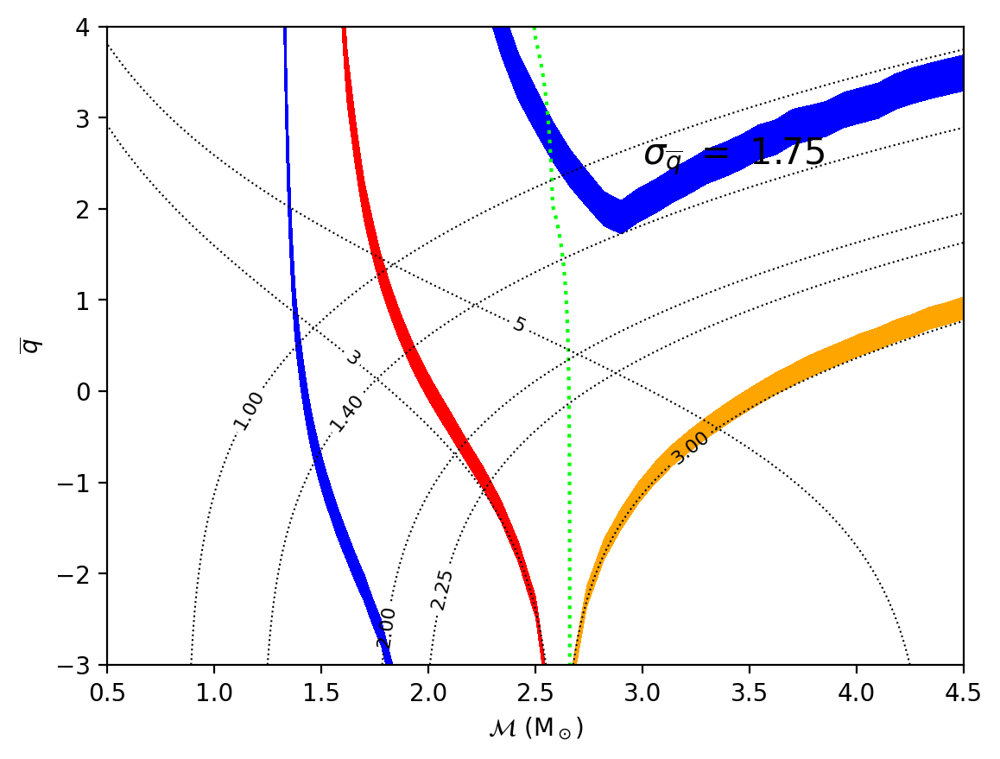

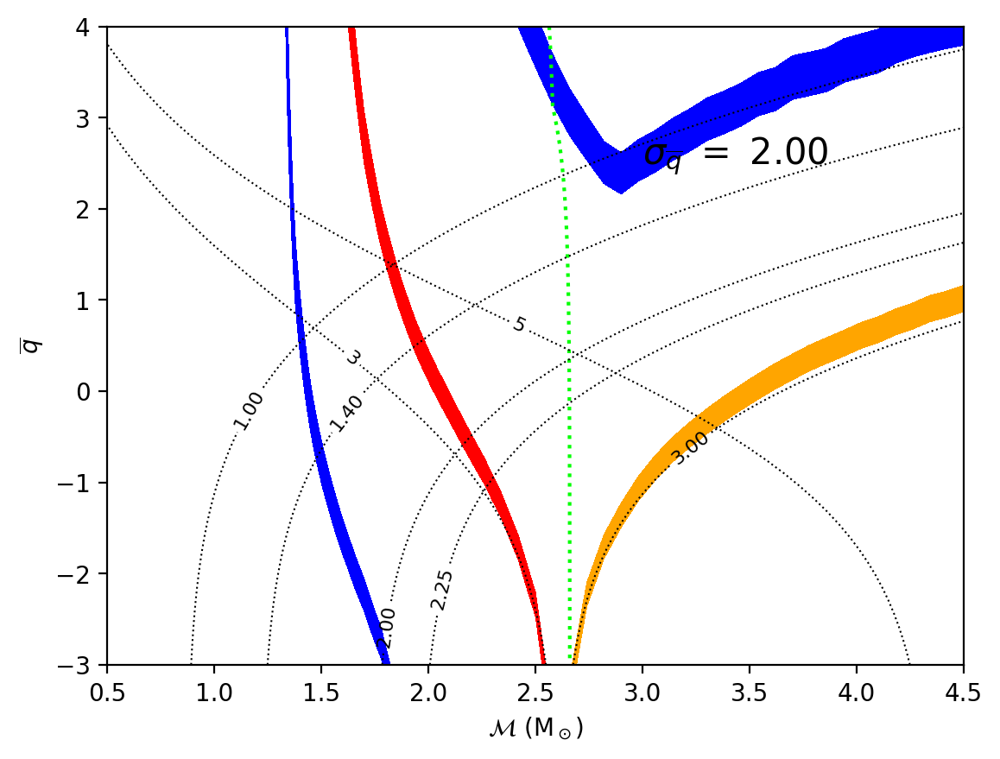

...

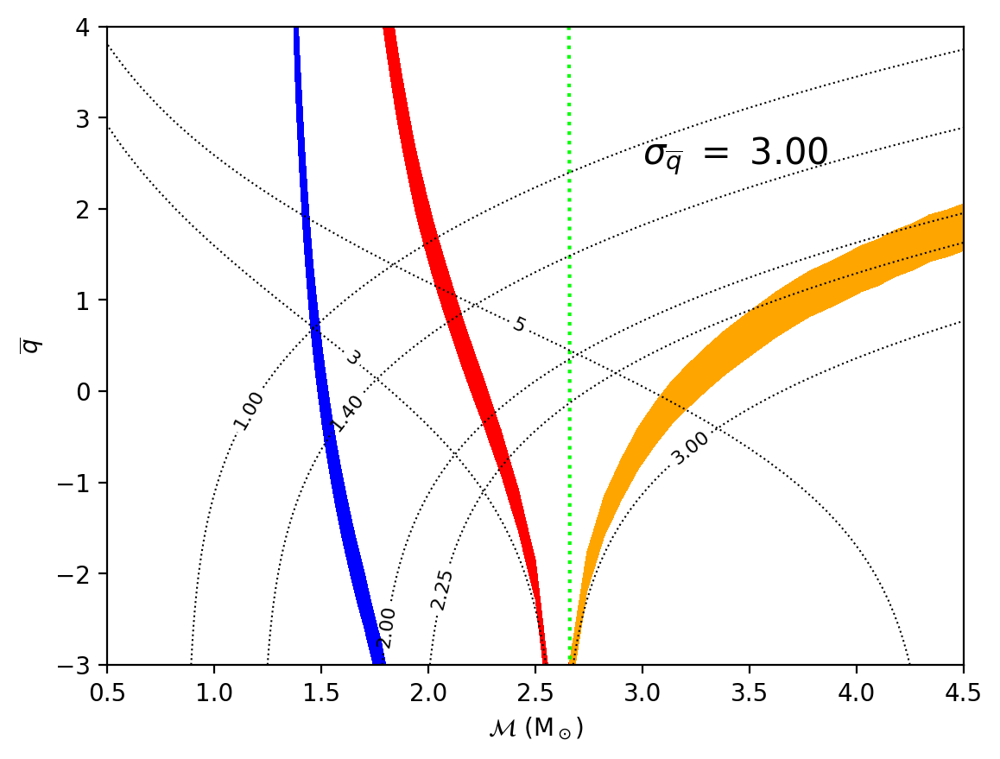

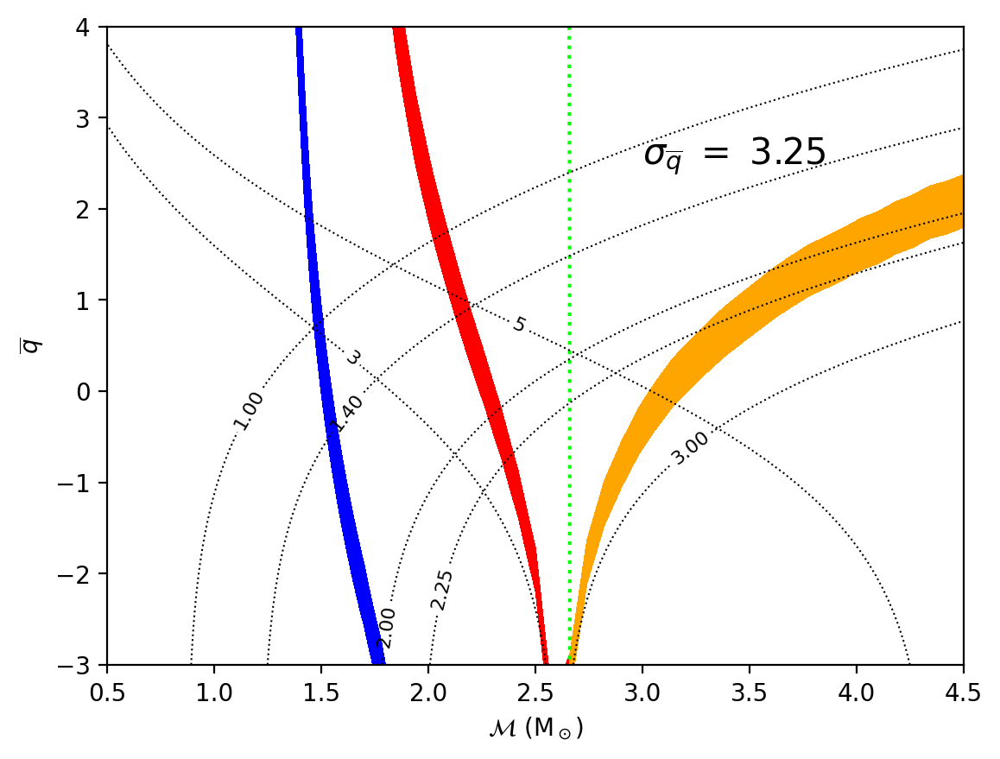

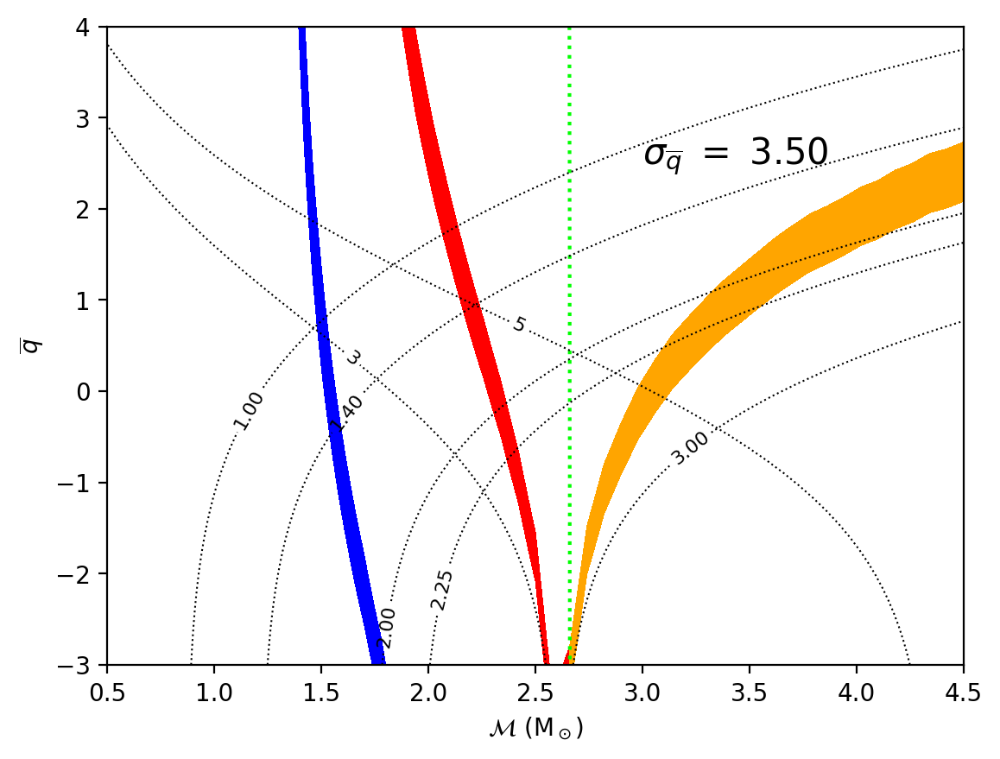

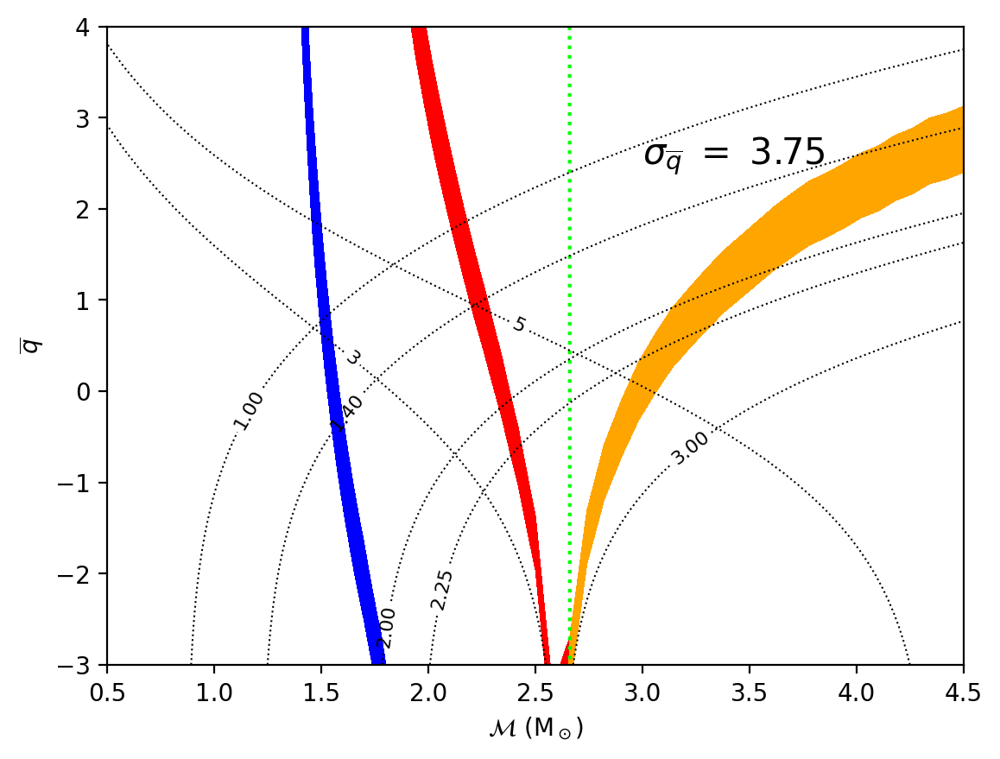

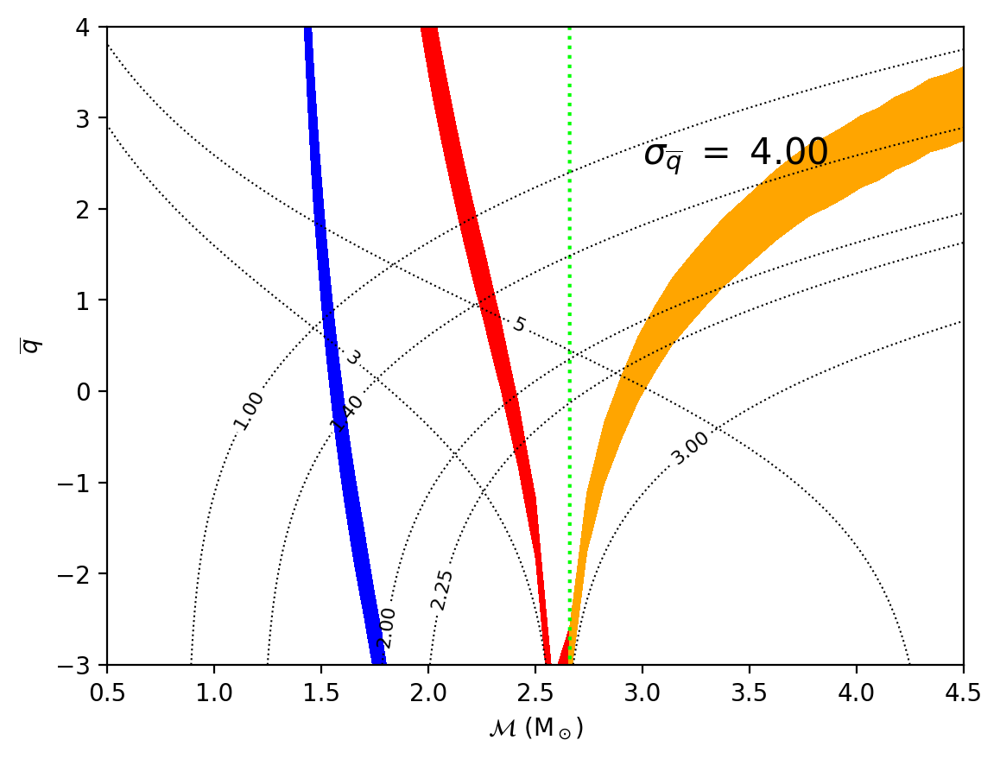

In [ ]:
# MERGER PROBABILITY CONTOUR PLOT IN MCH-Q SPACE
# INTERSECTION OF TWO CONTOURS (S230627c)

# method to create polygons of contours to calculate intersection of bands
def to_multipolygon(contour):
  if (contour is not None):
    polygons = [Polygon(item.get_paths()[0].vertices) for item in contour.collections if len(item.get_paths()) > 0]
    multipoly = so.unary_union(polygons)
    return multipoly

# loading chirp mass (e_mch) and mass ratio error (e_q) data
e_q_arr = original_df['e_q'].drop_duplicates().to_numpy()
e_mch = 0.05

# lists for figures and data
figs = []
mch_list, mch_max_list, mch_min_list = [], [], []
q_bar_list, q_bar_max_list, q_bar_min_list = [], [], []
e_q_intersection_list = []
intersection_list = []

# looping to create all plots for each e_q data
for e_q in e_q_arr:
  # loading data for the axes (chirp mass and q_bar)
  df = original_df.loc[original_df['e_q'] == e_q]
  mch_0 = df["mch_0"].drop_duplicates().to_numpy()
  q_0 = df["q_0"].drop_duplicates().to_numpy()

  # calculates m1 and m2 in terms of the axes
  n = int(math.sqrt(len(df)))
  m1 = np.empty([n,n])
  m2 = np.empty([n,n])
  q = np.array([math.exp(i)+1 for i in q_0])
  for i in range(n):
    for j in range(n):
      m1[i][j]=mch_0[j]*((1+q[i])**0.2)*(q[i]**0.4)
      m2[i][j]=m1[i][j]/q[i]

  # plot properties
  fig, ax = plt.subplots()
  fig.dpi = 200
  plt.ylabel(r"$\overline{q}$")
  plt.xlabel(r"$\mathcal{M}$ (M$_\odot$)")
  ax.set_xlim([0.5,4.5])
  ax.set_ylim([-3,4])

  # draws contours of m1 and m2
  mass1_contour = ax.contour(mch_0,q_0,m1,[3,5],linestyles='dotted',colors='black',linewidths=0.75,zorder=20)
  mass2_contour = ax.contour(mch_0,q_0,m2,[1,1.4,2,2.25,3],linestyles='dotted',colors='black',linewidths=0.75,zorder=20)
  mass1_contour.clabel(mass1_contour.levels,inline=True,fontsize=8)
  mass2_contour.clabel(mass2_contour.levels,inline=True,fontsize=8)

  # changing merger probability data format for contour
  p_bns = np.empty([n,n])
  p_bhns = np.empty([n,n])
  p_gap = np.empty([n,n])
  p_bbh = np.empty([n,n])
  p_ns = np.empty([n,n])
  for i in range(n):
      p_bns[:][i] = df['p_bns'].loc[df['q_0'] == q_0[i]]
      p_bhns[:][i] = df['p_bhns'].loc[df['q_0'] == q_0[i]]
      p_gap[:][i] = df['p_gap'].loc[df['q_0'] == q_0[i]]
      p_bbh[:][i] = df['p_bbh'].loc[df['q_0'] == q_0[i]]
      p_ns[:][i] = df['p_ns'].loc[df['q_0'] == q_0[i]]

  # creates bands for each merger probability
  prob_bands = [
      (p_bns, candidate_p_bns, 'lime'),
      (p_bhns, candidate_p_bhns, 'red'),
      (p_gap, candidate_p_gap, 'blue'),
      (p_bbh, candidate_p_bbh, 'orange'),
      (p_ns, candidate_p_ns, 'purple'),
    ]

  erase_area = []
  if mass_outer_limit > 0: erase_area.append(ax.contourf(mch_0, q_0, m2, [0,mass_outer_limit], alpha=0))
  erase_area.append(ax.contourf(mch_0, q_0, m2, [ns_mass_limit,5], alpha=0))
  erase_area.append(ax.contourf(mch_0, q_0, p_bns, [0.001,1.0], alpha=0))

  polygons = []
  for p_values, candidate_prob, color in prob_bands:
    if candidate_prob < 0.025:
      if candidate_prob == 0: candidate_prob = 0.001
      contour = ax.contour(mch_0, q_0, p_values, [candidate_prob], colors=color, linestyles='dotted')
    elif candidate_prob == 1:
      candidate_prob = 0.999
      contour = ax.contour(mch_0, q_0, p_values, [candidate_prob], colors=color, linestyles='dotted')
    else:
      contour = ax.contourf(mch_0, q_0, p_values, [candidate_prob - 0.025, candidate_prob + 0.025], colors=color)
      # determines and plots all the intersections and stores data in lists
      polygons.append(to_multipolygon(contour))
      intersection_length = len(polygons)

  for i in range(intersection_length):
    for j in range(i+1,intersection_length):
      p1 = polygons[i]
      p2 = polygons[j]
      if (p1 is not None and p2 is not None):
        contour_intersect = shapely.intersection(p1,p2)

        for area in erase_area:
          if not contour_intersect.is_empty: contour_intersect = contour_intersect.difference(to_multipolygon(area))
          else: break

        if not contour_intersect.is_empty:
          # contour_intersect = shapely.convex_hull(contour_intersect)
          plt.fill_between(*contour_intersect.exterior.xy,hatch="/////")
          plt.plot(*contour_intersect.exterior.xy,color="black",linewidth=1)
          centroid = contour_intersect.centroid
          ellipse = mpl.patches.Ellipse([centroid.x,centroid.y], width=2*e_mch, height=2*e_q,linewidth=0.75,linestyle='dashed',facecolor='none',edgecolor='black',zorder=20)
          ax.add_patch(ellipse)

          bounds = contour_intersect.bounds
          mch_list.append(centroid.x)
          mch_min_list.append(bounds[0])
          mch_max_list.append(bounds[2])
          q_bar_list.append(centroid.y)
          q_bar_min_list.append(bounds[1])
          q_bar_max_list.append(bounds[3])
          e_q_intersection_list.append(e_q)
          intersection_list.append(contour_intersect)

  # appends figure to list of figures
  ax.text(3.0,2.5,r"$\sigma_{\overline{q}}$ $=$ " + str('{:.2f}'.format(e_q)),fontsize=15) # label for error in q
  figs.append(fig)

# saves figures in one pdf file
p = PdfPages(url[-16:-4] + "_" + signal_name+ "_ver20230724" + ".pdf")
for fig in figs:
    fig.savefig(p, format='pdf')